######################################################################
# Project Outline
######################################################################

**Final Project for my Data Science Course Work**<br>
**Don't get Kicked! A Lemon Car Challenge**<br><br>
**Description:**

One of the biggest challenges of an auto dealership purchasing a used car at an auto auction is the risk of that the vehicle might have serious issues that prevent it from being sold to customers. The auto community calls these unfortunate purchases "kicks".

Kicked cars often result when there are tampered odometers, mechanical issues the dealer is not able to address, issues with getting the vehicle title from the seller, or some other unforeseen problem. Kick cars can be very costly to dealers after transportation cost, throw-away repair work, and market losses in reselling the vehicle.

Modelers who can figure out which cars have a higher risk of being kick can provide real value to dealerships trying to provide the best inventory selection possible to their customers.

The challenge of this competition is to predict if the car purchased at the Auction is a Kick (bad buy).

**Identifying key questions hat will become useful for solving this problem** 

**What problem does the model aim to solve?**
The machine learning model aims to predict the classification of used cars into the following categories: IsBadBuy (yes/no).

**What type of problem is it?**
This  is a classification problem.

**What would an application using my model look like?**
Before purchasing, relevant information about used cars is gathered and provided to the trained model. Based on the machine learning model's predictions, it assesses whether the car to be purchased is a potential "IsBadBuy (yes)". Using this prediction, a decision is made whether to proceed with the purchase.

**What requirements does the client have for the model?**
The main requirement is to exclude as many "IsBadBuy" cars as possible from purchase without excluding "too many" good cars. This means minimizing the proportion of false positives. Excluding too many false positives could potentially harm the business.

**What data do I need to build your model?**
I assume that data collected after the purchase cannot be used for my machine learning model, as this type of data will not be available in live application. Therefore, I was not entirely clear on how to handle the MMR-Current columns, for example. However, since the task description was not specific about this, I continued to use the MMR-Current columns. In production, predictions would be made before the purchase, so MMR-Current and MMR-Acquisition prices would be essentially the same.

######################################################################
# Part 1 EDA
######################################################################

In [1]:
######################################################################
# import required modules
######################################################################
# Universal
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import warnings

######################################################################
# Preprocessing specific
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from imblearn.under_sampling import RandomUnderSampler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
######################################################################
# Models
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_validate, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
######################################################################
# Classification
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report
######################################################################
# Fitting
from imblearn.pipeline import Pipeline as ImbPipeline
######################################################################
# Validation
from sklearn.model_selection import GridSearchCV
######################################################################
# Metrics
# Precision, Recall, F1 (harmonic mean of Precision + Recall), Roc_Auc, Classification_Report

from sklearn import metrics
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix

# Now the metrics functions can be called with the prefix 'metrics.'
#precision = metrics.precision_score(y_true, y_pred)
#recall = metrics.recall_score(y_true, y_pred)
#f1 = metrics.f1_score(y_true, y_pred)
#roc_auc = metrics.roc_auc_score(y_true, y_scores)
#report = metrics.classification_report(y_true, y_pred)

In [2]:
############################################
# Import and read data dictionary
# to get familiar with the columns
############################################

file_path = '/Users/derphantomben/Documents/Coding/Portfolio/LemonCarsChallenge/DontGetKicked/Carvana_Data_Dictionary.txt'
data = []

with open(file_path, 'r') as file:
    for line in file:
        parts = [part.strip() for part in line.split('\t') if part.strip()]
        if len(parts) >= 2:
            data.append(parts[:2])  # Only consider the first two elements 
            # Ensure that each line of the file is split into only two parts, based on the delimiter (here, tabs \t). 
            # This was necessary because an error indicated that some lines in the file contain more than two parts when split by tabs.

# Creating a DataFrame called 'df_dict' using pandas
df_dict = pd.DataFrame(data, columns=['Field Name', 'Definition'])

############################################
# Output dictionary as table
display(df_dict)

,Field Name,Definition
0,Field Name,Definition
1,RefID,Unique (sequential) number assigned to vehicles
2,IsBadBuy,Identifies if the kicked vehicle was an avoida...
3,PurchDate,The Date the vehicle was Purchased at Auction
4,Auction,Auction provider at which the vehicle was pur...
5,VehYear,The manufacturer's year of the vehicle
6,VehicleAge,The Years elapsed since the manufacturer's year
7,Make,Vehicle Manufacturer
8,Model,Vehicle Model
9,Trim,Vehicle Trim Level


In [3]:
############################################
# Read data
############################################

file_path_2 = '/Users/derphantomben/Documents/Coding/Portfolio/LemonCarsChallenge/DontGetKicked/training.csv'
df_car = pd.read_csv(file_path_2 , na_values = 'null')

# I chose na_values = 'null' so pandas treats any instances of the string 'null' in the CSV as a 
# NaN (Not a Number). --> this way it will be ensured that missing values that may be represented 
# as str 'null' will be correctly identified as missing values.

############################################
# Checking head

df_car.head()

,RefId,IsBadBuy,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,...,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost
0,1,0,12/7/2009,ADESA,2006,3,MAZDA,MAZDA3,i,4D SEDAN I,...,11597.0,12409.0,NaN,NaN,21973,33619,FL,7100.0,0,1113
1,2,0,12/7/2009,ADESA,2004,5,DODGE,1500 RAM PICKUP 2WD,ST,QUAD CAB 4.7L SLT,...,11374.0,12791.0,NaN,NaN,19638,33619,FL,7600.0,0,1053
2,3,0,12/7/2009,ADESA,2005,4,DODGE,STRATUS V6,SXT,4D SEDAN SXT FFV,...,7146.0,8702.0,NaN,NaN,19638,33619,FL,4900.0,0,1389
3,4,0,12/7/2009,ADESA,2004,5,DODGE,NEON,SXT,4D SEDAN,...,4375.0,5518.0,NaN,NaN,19638,33619,FL,4100.0,0,630
4,5,0,12/7/2009,ADESA,2005,4,FORD,FOCUS,ZX3,2D COUPE ZX3,...,6739.0,7911.0,NaN,NaN,19638,33619,FL,4000.0,0,1020


In [4]:
############################################
# Checking summary statistics
############################################
df_car.describe().T

,count,mean,std,min,25%,50%,75%,max
RefId,72983.0,36511.428497,21077.241302,1.0,18257.5,36514.0,54764.5,73014.0
IsBadBuy,72983.0,0.122988,0.328425,0.0,0.0,0.0,0.0,1.0
VehYear,72983.0,2005.343052,1.731252,2001.0,2004.0,2005.0,2007.0,2010.0
VehicleAge,72983.0,4.176644,1.712210,0.0,3.0,4.0,5.0,9.0
WheelTypeID,69814.0,1.494299,0.521290,0.0,1.0,1.0,2.0,3.0
VehOdo,72983.0,71499.995917,14578.913128,4825.0,61837.0,73361.0,82436.0,115717.0
MMRAcquisitionAuctionAveragePrice,72965.0,6128.909217,2461.992768,0.0,4273.0,6097.0,7765.0,35722.0
MMRAcquisitionAuctionCleanPrice,72965.0,7373.636031,2722.491986,0.0,5406.0,7303.0,9021.0,36859.0
MMRAcquisitionRetailAveragePrice,72965.0,8497.034332,3156.285284,0.0,6280.0,8444.0,10651.0,39080.0
MMRAcquisitonRetailCleanPrice,72965.0,9850.928240,3385.789541,0.0,7493.0,9789.0,12088.0,41482.0


In [5]:
############################################
# Checking for number of rows and columns
############################################
print('The number of rows is {}, while there are {} columns.'.format(*df_car.shape))

The number of rows is 72983, while there are 34 columns.


In [6]:
############################################
# Checking datatypes
############################################
df_car.dtypes

RefId                                  int64
IsBadBuy                               int64
PurchDate                             object
Auction                               object
VehYear                                int64
VehicleAge                             int64
Make                                  object
Model                                 object
Trim                                  object
SubModel                              object
Color                                 object
Transmission                          object
WheelTypeID                          float64
WheelType                             object
VehOdo                                 int64
Nationality                           object
Size                                  object
TopThreeAmericanName                  object
MMRAcquisitionAuctionAveragePrice    float64
MMRAcquisitionAuctionCleanPrice      float64
MMRAcquisitionRetailAveragePrice     float64
MMRAcquisitonRetailCleanPrice        float64
MMRCurrent

In [7]:
############################################
# Column data type conversion
############################################

# Convert 'IsBadBuy' from int64 to categorical
# df_car['IsBadBuy'] = df_car['IsBadBuy'].astype('category') #<-- I'm leaving 'IsBadBuy' as int for correlation matrix

############################################

# Convert 'PurchDate' to datetime
df_car['PurchDate'] = pd.to_datetime(df_car['PurchDate'], format='%m/%d/%Y', errors='coerce')
# unit='s'<-- time of duration represented in seconds
############################################

# Convert 'WheelTypeID' from float64 to object
df_car['WheelTypeID'] = df_car['WheelTypeID'].astype('object')

############################################

# Convert MMRAcquisition* to MMRCurrent* prices from float64 to int
price_columns = ['MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice', 'MMRAcquisitionRetailAveragePrice',
                 'MMRAcquisitonRetailCleanPrice', 'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice', 
                 'MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice']

for col in price_columns:
    df_car[col] = df_car[col].astype('int', errors='ignore')  
    # 'ignore' to not raise an error if conversion fails due to NaNs

############################################        
# Convert 'BYRNO' from int64 to object
df_car['BYRNO'] = df_car['BYRNO'].astype('object')
############################################
# Convert 'VNZIP1' from int64 to object
df_car['VNZIP1'] = df_car['VNZIP1'].astype('object')
############################################
# Convert 'VehBCost' from float64 to int
df_car['VehBCost'] = df_car['VehBCost'].astype('int', errors='ignore')
############################################
# Convert 'IsOnlineSale' from int64 to object
df_car['IsOnlineSale'] = df_car['IsOnlineSale'].astype('object')

############################################
# Display the dtypes to confirm changes
display(df_car.dtypes)

RefId                                         int64
IsBadBuy                                      int64
PurchDate                            datetime64[ns]
Auction                                      object
VehYear                                       int64
VehicleAge                                    int64
Make                                         object
Model                                        object
Trim                                         object
SubModel                                     object
Color                                        object
Transmission                                 object
WheelTypeID                                  object
WheelType                                    object
VehOdo                                        int64
Nationality                                  object
Size                                         object
TopThreeAmericanName                         object
MMRAcquisitionAuctionAveragePrice           float64
MMRAcquisiti

In [8]:
############################################
# Replace inf with NaN
############################################

# Suppressing future warnings about downcasting
pd.set_option('mode.chained_assignment', None)  # Suppresses warning about chained assignment
pd.set_option('future.no_silent_downcasting', True)  # Suppresses warning about downcasting behavior

# Replace inf values
df_car.replace([np.inf, -np.inf], np.nan, inplace=True)

# Resetting the options to default if needed
pd.reset_option('mode.chained_assignment')
pd.reset_option('future.no_silent_downcasting')

In [9]:
############################################
# TChecking for missing values, size, and duplicates
############################################

# 1. Check the number of NaN values in each row
nan_counts = df_car.isnull().sum(axis=1)

# NaN values per row
print("Number of NaN values in each row:")
print(nan_counts)
print('----------------------------------')

# Total number of NaNs across all rows
total_nans_rows = nan_counts.sum()
print("Total number of NaN values across all rows: {}".format(total_nans_rows))
print('----------------------------------')

# Counts of NaN values per column
nan_counts_col = df_car.isnull().sum()
print("Number of NaN values in each column:")
print(nan_counts_col)
print('----------------------------------')

# Total number of NaNs across all columns
total_nans_columns = nan_counts_col.sum()
print('Total number of NaN values across all columns: {}'.format(total_nans_columns))
print('----------------------------------')

# Percentage of NaNs in the dataset
total_elements = df_car.size
percent_nans = (total_nans_columns / total_elements) * 100
print("Percentage of NaN values in the dataset: {:.2f}%".format(percent_nans))
print('----------------------------------\n')

############################################
# 2. Number of rows and columns (size of dataset df)
print('The dataframe "df" has {} rows and {} columns.'.format(*df_car.shape))
print('The total number of elements within "df" is:', df_car.size)
print('\n----------------------------------\n')

############################################
# 3. Duplicates check
duplicate_rows = df_car[df_car.duplicated()]

print('Duplicate rows check:')

# Display duplicate rows, if any
if not duplicate_rows.empty:
    print('Duplicate Rows:')
    display(duplicate_rows)
else:
    print('No duplicate rows found!')
    print('----------------------------------')

Number of NaN values in each row:
0        2
1        2
2        2
3        2
4        2
        ..
72978    2
72979    4
72980    2
72981    2
72982    2
Length: 72983, dtype: int64
----------------------------------
Total number of NaN values across all rows: 149203
----------------------------------
Number of NaN values in each column:
RefId                                    0
IsBadBuy                                 0
PurchDate                                0
Auction                                  0
VehYear                                  0
VehicleAge                               0
Make                                     0
Model                                    0
Trim                                  2360
SubModel                                 8
Color                                    8
Transmission                             9
WheelTypeID                           3169
WheelType                             3174
VehOdo                                   0
Nationality   

In [10]:
############################################
# Dealing with NaNs for catigorical and numerical columns
# (This is only for during the EDA <-- new eread in of dataframe before train-trest split)
############################################

cat_cols_nan = ['Trim', 'SubModel', 'Color', 'Transmission', 'WheelTypeID', 'WheelType', 'Nationality', 'Size', 
                'TopThreeAmericanName', 'PRIMEUNIT', 'AUCGUART', 'BYRNO', 'VNZIP1', 'VNST', 'IsOnlineSale']

for column in cat_cols_nan:
    if df_car[column].isnull().any():
        df_car[column] = df_car[column].fillna('Unknown')

        
num_cols_nan = ['MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice', 
                'MMRAcquisitionRetailAveragePrice', 'MMRAcquisitonRetailCleanPrice',
                'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice',
                'MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice', 'VehBCost']

for column in num_cols_nan:
    median_value = df_car[column].median()
    df_car[column] = df_car[column].fillna(median_value)


# Counts of NaN values per column
nan_counts_col = df_car.isnull().sum()
print("Number of NaNs values in each column:")
print('----------------------------------')
print(nan_counts_col)

Number of NaNs values in each column:
----------------------------------
RefId                                0
IsBadBuy                             0
PurchDate                            0
Auction                              0
VehYear                              0
VehicleAge                           0
Make                                 0
Model                                0
Trim                                 0
SubModel                             0
Color                                0
Transmission                         0
WheelTypeID                          0
WheelType                            0
VehOdo                               0
Nationality                          0
Size                                 0
TopThreeAmericanName                 0
MMRAcquisitionAuctionAveragePrice    0
MMRAcquisitionAuctionCleanPrice      0
MMRAcquisitionRetailAveragePrice     0
MMRAcquisitonRetailCleanPrice        0
MMRCurrentAuctionAveragePrice        0
MMRCurrentAuctionCleanPrice   

In [11]:
############################################
# Calculating ratio IsBadBuys with respect to all purchases ratio 
############################################

total_buys = len(df_car['IsBadBuy'])
bad_buys = df_car['IsBadBuy'].sum()

# Calculating the percentage of bad buys
percentage_bad_buys = (bad_buys / total_buys) * 100

# Output
print("Total Buys: {}".format(total_buys))
print("Bad Buys: {}".format(bad_buys))
print("Percentage of Bad Buys: {:.2f}%".format(percentage_bad_buys))

Total Buys: 72983
Bad Buys: 8976
Percentage of Bad Buys: 12.30%


In [12]:
############################################
# Searching for unique values
############################################

# Unique values for each column in df:
for col in df_car.columns:
    unique_vals = df_car[col].unique()
    display("Unique values in '{}': {}".format(col, unique_vals))

print('\n' + '-'*34 + '\n')
    
# The number of unique values using 'nunique':
for col in df_car.columns:
    num_unique_vals = df_car[col].nunique()
    display("Number of unique values in '{}': {}".format(col, num_unique_vals))

"Unique values in 'RefId': [    1     2     3 ... 73012 73013 73014]"

"Unique values in 'IsBadBuy': [0 1]"

"Unique values in 'PurchDate': <DatetimeArray>\n['2009-12-07 00:00:00', '2009-12-14 00:00:00', '2009-12-21 00:00:00',\n '2009-12-28 00:00:00', '2010-01-04 00:00:00', '2010-01-11 00:00:00',\n '2010-01-18 00:00:00', '2010-01-25 00:00:00', '2010-02-01 00:00:00',\n '2010-02-08 00:00:00',\n ...\n '2009-11-27 00:00:00', '2010-11-26 00:00:00', '2009-11-08 00:00:00',\n '2010-01-15 00:00:00', '2010-01-29 00:00:00', '2010-01-08 00:00:00',\n '2010-02-20 00:00:00', '2010-12-04 00:00:00', '2010-12-24 00:00:00',\n '2010-12-30 00:00:00']\nLength: 517, dtype: datetime64[ns]"

"Unique values in 'Auction': ['ADESA' 'OTHER' 'MANHEIM']"

"Unique values in 'VehYear': [2006 2004 2005 2007 2001 2003 2002 2008 2009 2010]"

"Unique values in 'VehicleAge': [3 5 4 2 8 6 7 9 1 0]"

"Unique values in 'Make': ['MAZDA' 'DODGE' 'FORD' 'MITSUBISHI' 'KIA' 'GMC' 'NISSAN' 'CHEVROLET'\n 'SATURN' 'CHRYSLER' 'MERCURY' 'HYUNDAI' 'TOYOTA' 'PONTIAC' 'SUZUKI'\n 'JEEP' 'HONDA' 'OLDSMOBILE' 'BUICK' 'SCION' 'VOLKSWAGEN' 'ISUZU'\n 'LINCOLN' 'MINI' 'SUBARU' 'CADILLAC' 'VOLVO' 'INFINITI' 'PLYMOUTH'\n 'LEXUS' 'ACURA' 'TOYOTA SCION' 'HUMMER']"

"Unique values in 'Model': ['MAZDA3' '1500 RAM PICKUP 2WD' 'STRATUS V6' ... 'EXCURSION 4WD V8 5.4'\n 'M45 4.5L V8 MPI / SF' 'PATRIOT 2WD 4C 2.0L']"

"Unique values in 'Trim': ['i' 'ST' 'SXT' 'ZX3' 'ES' 'EX' 'SE' 'SEL' 'SLE' 'XL' 'Bas' 'LS' 'Unknown'\n 'SS' 'SLT' '150' 'Spo' 'LX' 'GLS' 'CE' 'GT' 'Lar' '2' 'Adv' 'SR5' 'GXP'\n 'Tou' 'XLT' 'LT' 'SES' 'XLS' 'GL' 'LE' '1' 'L20' 'Lim' 's' 'Edd' '3'\n 'Edg' 'ZTW' 'ZX4' 'STX' 'CX' 'Nor' 'GS' 'XE' 'CXL' 'Ren' 'LTZ' 'ZTS' 'S'\n 'GTC' 'GTP' 'Cla' 'Spy' 'LXi' 'SE-' 'Exe' 'Pre' 'SL2' 'GXE' 'SL1' 'Cus'\n 'GLE' 'DE' 'Z71' 'Si' 'X' 'SX' 'XR' 'SVT' 'GTS' 'LW3' 'SV6' 'Val' 'Car'\n 'eL' 'DX' 'Spe' 'W/T' 'LW2' 'Pro' 'SL' 'L30' 'RT' 'CXS' 'VP' 'Cin' 'Max'\n 'Ral' 'Sta' 'Lux' 'R/T' 'Her' 'ZX5' 'Xsp' 'Kin' '3 R' 'Hig' 'GX' 'EX-'\n 'RS' 'Plu' 'Ult' 'DS' 'Ove' 'Den' 'XRS' 'SC2' 'Sig' 'SC1' 'XS' 'C' 'ZX2'\n 'ZXW' 'ZR2' 'Dur' 'OZ' 'L' '250' 'eC' 'FX4' 'Out' 'L10' 'Maz' 'Ent' 'T5'\n 'Z24' 'Har' 'LL' 'Hyb' 'JLX' 'JLS' 'L 3']"

"Unique values in 'SubModel': ['4D SEDAN I' 'QUAD CAB 4.7L SLT' '4D SEDAN SXT FFV' '4D SEDAN'\n '2D COUPE ZX3' '4D SEDAN ES' '4D SEDAN EX' '4D SEDAN SE' '4D SEDAN SEL'\n 'REG CAB 4.3L' 'REG CAB 4.2L XL' 'MINIVAN 3.3L' 'MINIVAN 3.8L' '2D COUPE'\n '4D SUV 4.2L' '4D CUV 2.2L' '4D UTILITY 4.2L SLE' '2D COUPE SS'\n 'PASSENGER 3.4L' '4D SUV 2.2L LS' '4D SEDAN LS PREMIUM' '4D SUV 5.7L SLT'\n 'MINIVAN 3.8L SXT' '4D UTILITY 5.3L FFV LS' '2D SUV 4.0L SPORT'\n '4D SUV-PICKUP 5.3L' 'PASSENGER 3.8L LX' 'PASSENGER 3.9L LX'\n '4D WAGON SXT' '4D SEDAN 1.8' '4D SPORT TOURER' '4D SEDAN LS 3.5L FFV'\n 'QUAD CAB 5.7L' '4D SPORT UTILITY' '4D SEDAN CE' '4D SEDAN GT'\n 'QUAD CAB 4.7L' '4D SEDAN LEVEL 2' '4D SUV 4.7L' '4D SUV 4.7L ADVENTURER'\n '4D SEDAN GLS' '4D SPORT UTILITY SPORT EDITION' '4D SEDAN GXP'\n '4D WAGON SPORT' '4D SUV' 'QUAD CAB 3.7L ST' '4D SUV 5.3L' '4D SEDAN LS'\n '4D SUV 4.6L XLT' '4D SUV 4.7L ST' '4D SPORT UTILITY EX' '4D SUV 2.2L LT'\n '4D SEDAN SES' '4D CUV 3.0L SEL' 'CREW CAB 5.4L KING 

"Unique values in 'Color': ['RED' 'WHITE' 'MAROON' 'SILVER' 'BLACK' 'GOLD' 'GREY' 'BLUE' 'BEIGE'\n 'PURPLE' 'ORANGE' 'GREEN' 'BROWN' 'YELLOW' 'NOT AVAIL' 'OTHER' 'Unknown']"

"Unique values in 'Transmission': ['AUTO' 'MANUAL' 'Unknown' 'Manual']"

"Unique values in 'WheelTypeID': [1.0 2.0 'Unknown' 3.0 0.0]"

"Unique values in 'WheelType': ['Alloy' 'Covers' 'Unknown' 'Special']"

"Unique values in 'VehOdo': [89046 93593 73807 ... 65399 45234 66855]"

"Unique values in 'Nationality': ['OTHER ASIAN' 'AMERICAN' 'TOP LINE ASIAN' 'OTHER' 'Unknown']"

"Unique values in 'Size': ['MEDIUM' 'LARGE TRUCK' 'COMPACT' 'LARGE' 'VAN' 'MEDIUM SUV' 'LARGE SUV'\n 'SPECIALTY' 'SPORTS' 'CROSSOVER' 'SMALL SUV' 'SMALL TRUCK' 'Unknown']"

"Unique values in 'TopThreeAmericanName': ['OTHER' 'CHRYSLER' 'FORD' 'GM' 'Unknown']"

"Unique values in 'MMRAcquisitionAuctionAveragePrice': [ 8155.  6854.  3202. ... 10622.  1449.  9842.]"

"Unique values in 'MMRAcquisitionAuctionCleanPrice': [ 9829.  8383.  4760. ... 12571.  2219. 13568.]"

"Unique values in 'MMRAcquisitionRetailAveragePrice': [11636. 10897.  6943. ...  2606. 12161.  2065.]"

"Unique values in 'MMRAcquisitonRetailCleanPrice': [13600. 12572.  8457. ...  2897.  3602.  4937.]"

"Unique values in 'MMRCurrentAuctionAveragePrice': [ 7451.  7456.  4035. ...  1782.  9778. 13646.]"

"Unique values in 'MMRCurrentAuctionCleanPrice': [ 8552.  9222.  5557. ... 13262. 11424. 15015.]"

"Unique values in 'MMRCurrentRetailAveragePrice': [11597. 11374.  7146. ...  2425. 13591. 17619.]"

"Unique values in 'MMRCurrentRetailCleanPrice': [12409. 12791.  8702. ... 17702. 19161. 14402.]"

"Unique values in 'PRIMEUNIT': ['Unknown' 'NO' 'YES']"

"Unique values in 'AUCGUART': ['Unknown' 'GREEN' 'RED']"

"Unique values in 'BYRNO': [21973 19638 5546 19619 20928 19064 20740 17675 99740 52117 22916 1231\n 20207 1235 17212 20833 8655 19662 22808 3453 21047 20392 25100 1045 18881\n 10315 18111 11410 16044 1141 52646 8172 52492 52598 1125 18880 52644\n 10430 18822 53245 1085 1082 835 20234 21053 99750 99761 1031 99741 1035\n 1191 1152 23359 1151 1051 23657 16926 1121 11210 1086 1055 1041 10420\n 10310 1081 1156 1157 16369 3582 10510 99760 10425 10410 18091]"

"Unique values in 'VNZIP1': [33619 20166 50111 72117 55369 38118 17406 16137 34203 45005 35004 48265\n 75061 78610 60440 60445 2764 77301 85040 30272 37138 27542 21075 94544\n 21014 77041 79605 84104 95673 97060 75020 92807 29697 32824 29461 76101\n 37421 80022 43207 85018 75236 76040 83716 97402 89506 85248 16066 29532\n 25177 32124 76063 35613 38637 80229 75050 73108 85009 80011 74135 79932\n 85284 32812 89139 27407 91763 78745 80112 32225 87109 70002 77073 25071\n 45011 38128 32750 34761 90045 22403 46803 30331 30529 60443 89120 89165\n 70460 85353 22801 19440 64161 99224 64153 17028 91770 33809 33314 85260\n 70401 47129 17545 30315 83687 87105 32503 78219 29323 3106 39402 26431\n 37122 8505 12552 92101 85338 90650 73129 68138 85204 97217 33073 23606\n 30120 42104 29070 39208 23234 92504 92057 46239 62207 71119 77086 78754\n 32772 33311 98064 92337 37771 91752 33916 78426 33762 63044 28625 85226\n 37210 28273 77061 84087 33411 80817 32219 78227 30212]"

"Unique values in 'VNST': ['FL' 'VA' 'IA' 'AR' 'MN' 'TN' 'PA' 'OH' 'AL' 'MI' 'TX' 'IL' 'MA' 'AZ'\n 'GA' 'NC' 'MD' 'CA' 'UT' 'OR' 'SC' 'CO' 'ID' 'NV' 'WV' 'MS' 'OK' 'NM'\n 'LA' 'IN' 'MO' 'WA' 'NH' 'NJ' 'NY' 'NE' 'KY']"

"Unique values in 'VehBCost': [ 7100  7600  4900 ... 11580 11945  3205]"

"Unique values in 'IsOnlineSale': [0 1]"

"Unique values in 'WarrantyCost': [1113 1053 1389  630 1020  594  533  825  482 1633 1373  869 1623  686\n 1455 1243 1923 1703 1551 2003 5613  671  728  754 2452  920 1411 1763\n 1220 1272 2322 1506  971 1215 2152  569 1155 1003 1283  623  723 1086\n 1503 1103 1209 1974 1641  462  803  983 2063  588 1137  986 1413 1583\n 1169  853 1134  975 1028 1118 1038 1806 1341 1313 1469 1125 1320  505\n 1497 1223  834 5392 1930 1153  582 1774  923  693 1800 1689 2074 1398\n 2274 2712 1485 1500 1673 2651  930 1740 1543 2218 4032 1275 1630 1508\n 1054  837 2351  702  620  905 1197 1353 2157  894  822  764  805 2282\n 1450 1251 1046 1769 2495 1065 1290 1216  833 3115  909 1906 6519 1803\n  782 1666 2040 3676 1515  993 2198 2506 1023 1606 2022 1481 3667 1628\n 1711 1857  765 1918  882 3276 3265 3910 1717 2193 2062 1893 5092 2939\n 2208 2412 2172 1801  553 1610 1750 3191 6192 2070 2508 6492 2711 1933\n  650 1130 2390 1572 2639  762 2091 2206 1634 1116 1334 2499 1386 1338\n  522 1613 3967 1062 4922 2391


----------------------------------



"Number of unique values in 'RefId': 72983"

"Number of unique values in 'IsBadBuy': 2"

"Number of unique values in 'PurchDate': 517"

"Number of unique values in 'Auction': 3"

"Number of unique values in 'VehYear': 10"

"Number of unique values in 'VehicleAge': 10"

"Number of unique values in 'Make': 33"

"Number of unique values in 'Model': 1063"

"Number of unique values in 'Trim': 135"

"Number of unique values in 'SubModel': 864"

"Number of unique values in 'Color': 17"

"Number of unique values in 'Transmission': 4"

"Number of unique values in 'WheelTypeID': 5"

"Number of unique values in 'WheelType': 4"

"Number of unique values in 'VehOdo': 39947"

"Number of unique values in 'Nationality': 5"

"Number of unique values in 'Size': 13"

"Number of unique values in 'TopThreeAmericanName': 5"

"Number of unique values in 'MMRAcquisitionAuctionAveragePrice': 10342"

"Number of unique values in 'MMRAcquisitionAuctionCleanPrice': 11379"

"Number of unique values in 'MMRAcquisitionRetailAveragePrice': 12725"

"Number of unique values in 'MMRAcquisitonRetailCleanPrice': 13456"

"Number of unique values in 'MMRCurrentAuctionAveragePrice': 10315"

"Number of unique values in 'MMRCurrentAuctionCleanPrice': 11265"

"Number of unique values in 'MMRCurrentRetailAveragePrice': 12493"

"Number of unique values in 'MMRCurrentRetailCleanPrice': 13192"

"Number of unique values in 'PRIMEUNIT': 3"

"Number of unique values in 'AUCGUART': 3"

"Number of unique values in 'BYRNO': 74"

"Number of unique values in 'VNZIP1': 153"

"Number of unique values in 'VNST': 37"

"Number of unique values in 'VehBCost': 2061"

"Number of unique values in 'IsOnlineSale': 2"

"Number of unique values in 'WarrantyCost': 281"

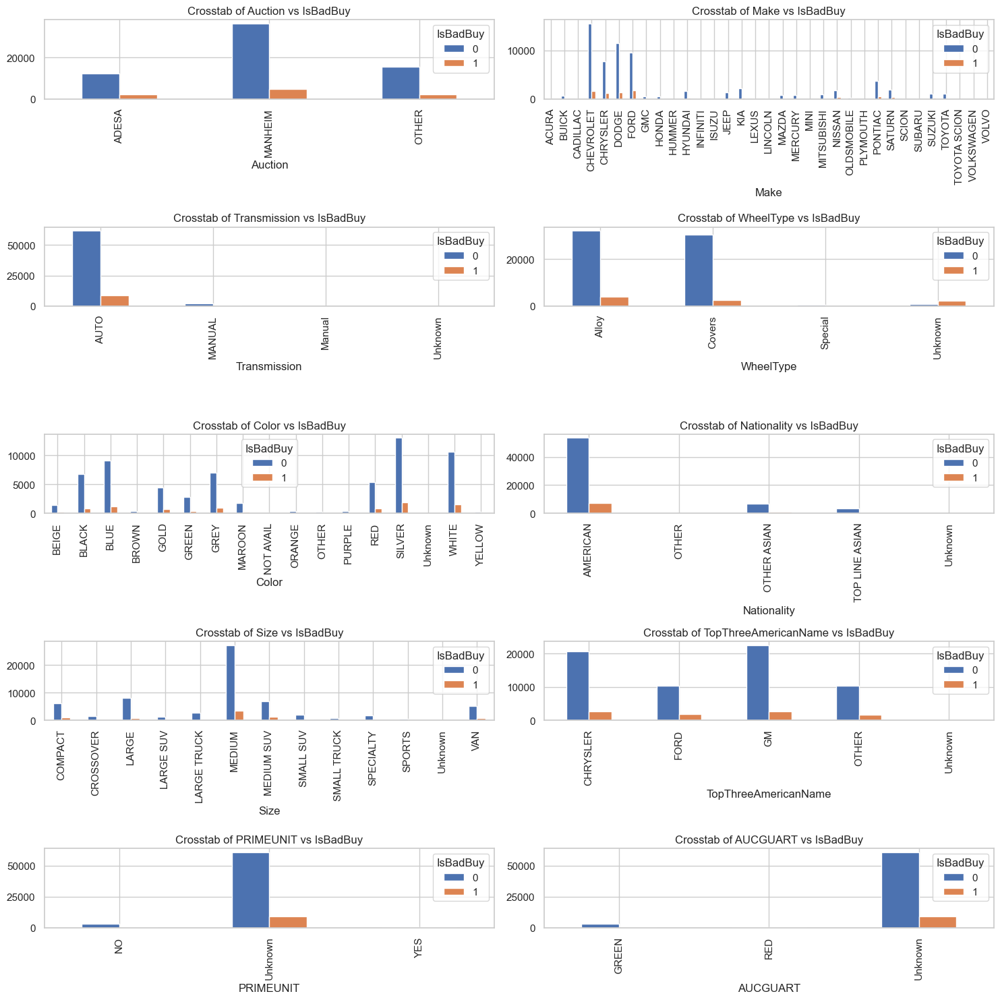

In [13]:
############################################
# Barplot relationship categorical (object) columns to target 
############################################

sns.set(style="whitegrid")

# Function 'plot_crosstab' that creates crosstabs between target and cat feature and represnts them as bar plot
def plot_crosstab(ax, df_car, feature, target='IsBadBuy', normalize=False):
    crosstab = pd.crosstab(index=df_car[feature], columns=df_car[target], normalize=normalize)
    crosstab.plot(kind='bar', ax=ax, title='Crosstab of {} vs {}'.format(feature, target))

# List of features (cat / object columns)
features = ['Auction', 'Make', 'Transmission', 'WheelType', 'Color', 
            'Nationality', 'Size', 'TopThreeAmericanName', 'PRIMEUNIT', 'AUCGUART']

# 'VNZIP1', 'BYRNO', 'VNST' in separate plots below
# 'IsOnlineSale', 'WheelTypeID' likely irrelevant 
# 'SubModel', 'Trim' likely too much detail
############################################

# Figure and axes with 2 columns / 5 rows
fig, axes = plt.subplots(nrows= 5, ncols=2, figsize=(15, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten() # create 1D array for easy itereation in for-loop

# Generate a bar plot for each feature
for i, feature in enumerate(features):
    plot_crosstab(axes[i], df_car, feature)

# Hide any empty subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

# Adjust the layout so titles and labels don't overlap
plt.tight_layout()

############################################

# Show the plot
plt.show()

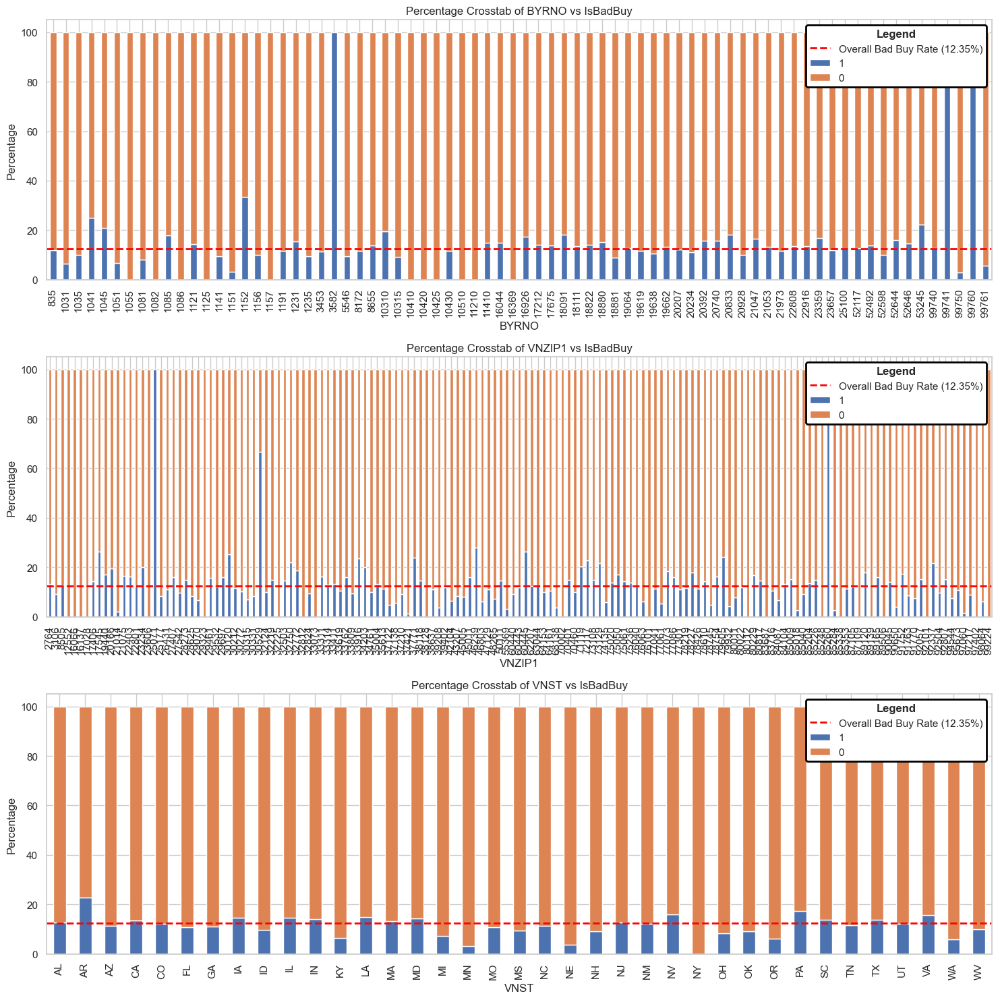

In [14]:
sns.set(style="whitegrid")

def plot_crosstab(ax, df_car, feature, target='IsBadBuy', normalize='index'):
    # Generating the crosstab with normalization by index
    crosstab = pd.crosstab(index=df_car[feature], columns=df_car[target], normalize=normalize)
    
    # Reorder the columns if necessary to ensure the bad buys (assuming 1) are plotted from the bottom
    if 1 in crosstab.columns:
        columns_order = [1, 0] if 0 in crosstab.columns else [1]  # Needed so that '1' (Bad Buys) are at the 
        # bottom
        crosstab = crosstab[columns_order]
    
    # Converting to percentage and plotting
    (crosstab * 100).plot(kind='bar', ax=ax, stacked=True, title='Percentage Crosstab of {} vs {}'.format(feature, target))
    ax.set_ylabel('Percentage')
    
    # Overlaying a horizontal red dashed line at 12.35% (Percentage of Bad Buys)
    ax.axhline(y=12.35, color='red', linestyle='--', linewidth=2, label='Overall Bad Buy Rate (12.35%)')
    ax.legend()
    
    # Enhancing the legend
    legend = ax.legend(facecolor='white', framealpha=1, edgecolor='black', frameon=True, loc='upper right', title='Legend')
    legend.get_frame().set_linewidth(2.0)  # Thicker border for the legend
    legend.get_frame().set_edgecolor("black")  # Black border for clarity
    legend.get_title().set_fontweight('bold')  # Bold the title of the legend
    
# List of features (categorical columns)
features = ['BYRNO', 'VNZIP1', 'VNST']

############################################

# Figure and axes with 2 columns / 2 rows
fig, axes = plt.subplots(nrows= 3, ncols=1, figsize=(15, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten() # create 1D array for easy itereation in for-loop

# Generate a bar plot for each feature
for i, feature in enumerate(features):
    plot_crosstab(axes[i], df_car, feature)

# Hide any empty subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

# Adjust the layout so titles and labels don't overlap
plt.tight_layout()

############################################
# Show the plot
plt.show()

In [15]:
############################################
# The 'BYRNO' with 'IsBadBuy' purchases > 12.35% (Percentage of Bad Buys)
############################################
# Create a crosstab of BYRNO vs IsBadBuy
crosstab = pd.crosstab(index=df_car['BYRNO'], columns=df_car['IsBadBuy'], normalize='index')

# Convert to percentage
crosstab *= 100
# Note: *= operator used for in-place multiplication. 
# It multiplies the left variable by the right value and then assigns the result back on the left side.

# Filter BYRNO with a bad buy rate greater than 12.35%
# Remninder: '1' represents a bad buy
bad_buy_byrno = crosstab[crosstab[1] > 12.35]

############################################
# Output
print('Buyer Numbers "BYRNO" with more than 12.35% bad purchases:')
print(bad_buy_byrno[1])
# [1] --> access 'Bad Buy' column

print('\nThe total number of buyers with lemon car purchases is:', (len(bad_buy_byrno[1])))

############################################

Buyer Numbers "BYRNO" with more than 12.35% bad purchases:
BYRNO
1041      25.000000
1045      20.967742
1085      18.000000
1121      14.285714
1152      33.333333
1231      15.424165
3582     100.000000
8655      13.851351
10310     19.565217
11410     15.000000
16044     14.898835
16926     17.469880
17212     14.064362
17675     13.909056
18091     18.181818
18111     13.475177
18822     14.129401
18880     15.078038
19064     12.742718
19662     13.381674
20392     15.686275
20740     15.700083
20833     18.168168
21047     16.666667
21053     13.387784
22808     13.668287
22916     13.569425
23359     16.859345
25100     12.453761
52117     12.820513
52492     13.852814
52644     15.938303
52646     14.697406
53245     22.222222
99740     12.827988
99741    100.000000
99760    100.000000
Name: 1, dtype: float64

The total number of buyers with lemon car purchases is: 37


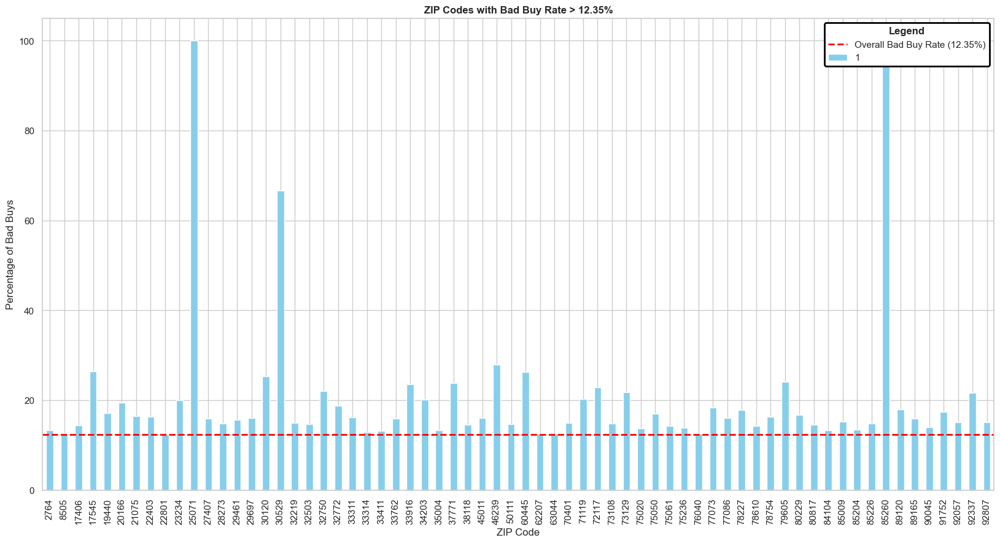

In [16]:
############################################
# Calculate percentages of bad buys per ZIP code
############################################
crosstab = pd.crosstab(df_car['VNZIP1'], df_car['IsBadBuy'], normalize='index') * 100

############################################
# Configure plot size
plt.figure(figsize=(20, 10))  # Larger figure size for better readability

# Plot ZIP codes where the bad buy rate is greater than 12.35%
ax = crosstab[crosstab[1] > 12.35][1].plot(kind='bar', color='skyblue')
plt.axhline(y=12.35, color='red', linestyle='--', linewidth=2, label='Overall Bad Buy Rate (12.35%)')

# Enhancing the legend
legend = ax.legend(facecolor='white', framealpha=1, edgecolor='black', frameon=True, loc='upper right', title='Legend')
legend.get_frame().set_linewidth(2.0)  # Thicker border for the legend
legend.get_frame().set_edgecolor("black")  # Black border for clarity
legend.get_title().set_fontweight('bold')  # Bold the title of the legend

############################################

plt.title('ZIP Codes with Bad Buy Rate > 12.35%', fontweight = 'bold')
plt.xlabel('ZIP Code')
plt.ylabel('Percentage of Bad Buys')
plt.show()

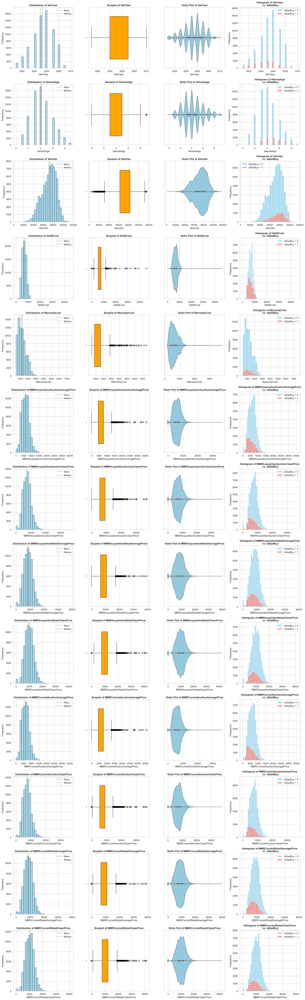

In [17]:
############################################
# Checking the distribution numerical values <-- My approach histogram, boxplot, violin plots comparison
############################################

# List of numerical columns 
num_columns = ['VehYear', 'VehicleAge', 'VehOdo', 'VehBCost', 'WarrantyCost', 'MMRAcquisitionAuctionAveragePrice', 
               'MMRAcquisitionAuctionCleanPrice', 'MMRAcquisitionRetailAveragePrice', 'MMRAcquisitonRetailCleanPrice', 
               'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice', 'MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice']

# Figure with subplots
fig, axes = plt.subplots(nrows=len(num_columns), ncols=4, figsize=(20, 5 * len(num_columns)))

# Iterate over the columns and create each plot
for i, col in enumerate(num_columns): # 'i' is the current index position of item in the list
    
    # A: Histogram
    axes[i, 0].hist(df_car[col].dropna(), bins=30, color='skyblue', edgecolor='black', alpha=0.7)
    mean_val = df_car[col].mean()
    median_val = df_car[col].median()
    axes[i, 0].axvline(mean_val, color='r', linestyle='--', label='Mean')
    axes[i, 0].axvline(median_val, color='g', linestyle='-.', label='Median')
    axes[i, 0].set_title('Distribution of {}'.format(col), fontweight='bold')
    axes[i, 0].set_xlabel(col)
    axes[i, 0].set_ylabel('Frequency')
    axes[i, 0].legend()

    # B: Boxplot
    axes[i, 1].boxplot(df_car[col].dropna(), vert=False, widths=0.7, patch_artist=True,
                       boxprops=dict(facecolor='orange', color='black'))
    axes[i, 1].set_title('Boxplot of {}'.format(col), fontweight='bold')
    axes[i, 1].set_xlabel(col)

    # C: Violin Plot
    sns.violinplot(data=df_car, x=col, ax=axes[i, 2], color='skyblue')
    axes[i, 2].set_title('Violin Plot of {}'.format(col), fontweight='bold')
    axes[i, 2].set_xlabel(col)
    
    # D: Histogram with target comparison in the fourth column.
    categories = df_car['IsBadBuy'].unique()
    colors = ['skyblue', 'salmon']  # Different color for each category
    for j, category in enumerate(categories):
        subset = df_car[df_car['IsBadBuy'] == category]
        axes[i, 3].hist(subset[col].dropna(), bins=30, color=colors[j], alpha=0.7, label='IsBadBuy = {}'.format(category))
    
    axes[i, 3].set_title('Histogram of {} \n vs. IsBadBuy'.format(col), fontweight='bold')
    axes[i, 3].set_xlabel(col)
    axes[i, 3].set_ylabel('Frequency')
    axes[i, 3].legend()

# Prevent overlapping titles
plt.tight_layout()

############################################
# Show the plot
plt.show()

########################################################################################
# Note: The `enumerate()` function used in the for loop is needed to loop over the columns and their 
# indices simultaneously. This allows for easy placement of each plot into the corresponding position in 
# the subplot grid.
########################################################################################

In [18]:
############################################
# Dealing with outliers
# (This is only for during the EDA <-- new read in of dataframe before train-test split in machine learning notebook)
############################################
# Set Pandas options to suppress warnings
pd.options.mode.chained_assignment = None  # Suppress warnings about chained assignment

############################################
# Dealing with outliers
outlier_num_cols = ['MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice', 'MMRAcquisitionRetailAveragePrice', 
                    'MMRAcquisitonRetailCleanPrice', 'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice', 
                    'MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice', 'VehicleAge', 'VehBCost', 'WarrantyCost']

# Dictionaries to store the lower and upper bounds for each column
lower_bounds = {}
upper_bounds = {}

# Loop through each numerical column to detect and impute outliers
for col in outlier_num_cols:
    # Calculating the median of the column for imputation
    median_value = df_car[col].median()

    # Filling NaN values with the median
    df_car[col] = df_car[col].fillna(median_value)

    # Calculating Q1, Q3, and IQR after handling NaNs
    Q1 = df_car[col].quantile(0.25)
    Q3 = df_car[col].quantile(0.75)
    IQR = Q3 - Q1

    # Calculating lower and upper bounds for outlier identification
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Replacing outliers with the median value
    df_car.loc[(df_car[col] < lower_bound) | (df_car[col] > upper_bound), col] = median_value

############################################
# Display final dataframe info
print("\nDataFrame summary statistic after outlier and NaN imputation:")
display(df_car.describe())


DataFrame summary statistic after outlier and NaN imputation:


,RefId,IsBadBuy,PurchDate,VehYear,VehicleAge,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VehBCost,WarrantyCost
count,72983.000000,72983.000000,72983,72983.000000,72983.000000,72983.000000,72983.000000,72983.000000,72983.000000,72983.000000,72983.000000,72983.000000,72983.000000,72983.000000,72983.00000,72983.000000
mean,36511.428497,0.122988,2010-01-10 02:51:53.590836224,2005.343052,4.132387,71499.995917,6066.862036,7272.077114,8449.567776,9894.999356,6064.577682,7339.275324,8791.107011,10149.575531,6714.42514,1241.105340
min,1.000000,0.000000,2009-01-05 00:00:00,2001.000000,0.000000,4825.000000,0.000000,0.000000,0.000000,1662.000000,0.000000,494.000000,899.000000,1034.000000,1915.00000,462.000000
25%,18257.500000,0.000000,2009-07-20 00:00:00,2004.000000,3.000000,61837.000000,4273.000000,5407.000000,6281.000000,7593.000000,4285.000000,5484.000000,6607.000000,7863.000000,5435.00000,837.000000
50%,36514.000000,0.000000,2010-01-21 00:00:00,2005.000000,4.000000,73361.000000,6097.000000,7303.000000,8444.000000,9789.000000,6062.000000,7313.000000,8729.000000,10103.000000,6700.00000,1155.000000
75%,54764.500000,0.000000,2010-07-14 00:00:00,2007.000000,5.000000,82436.000000,7707.000000,8926.500000,10610.000000,12031.000000,7669.000000,8898.000000,10849.500000,12260.000000,7895.00000,1543.000000
max,73014.000000,1.000000,2010-12-30 00:00:00,2010.000000,8.000000,115717.000000,13003.000000,14440.000000,17196.000000,18973.000000,12901.000000,14377.000000,17408.000000,19071.000000,11595.00000,2799.000000
std,21077.241302,0.328425,NaN,1.731252,1.650471,14578.913128,2340.580730,2540.680287,3066.677449,3091.566350,2300.978032,2423.045747,2909.555988,3071.866131,1718.63431,495.319957


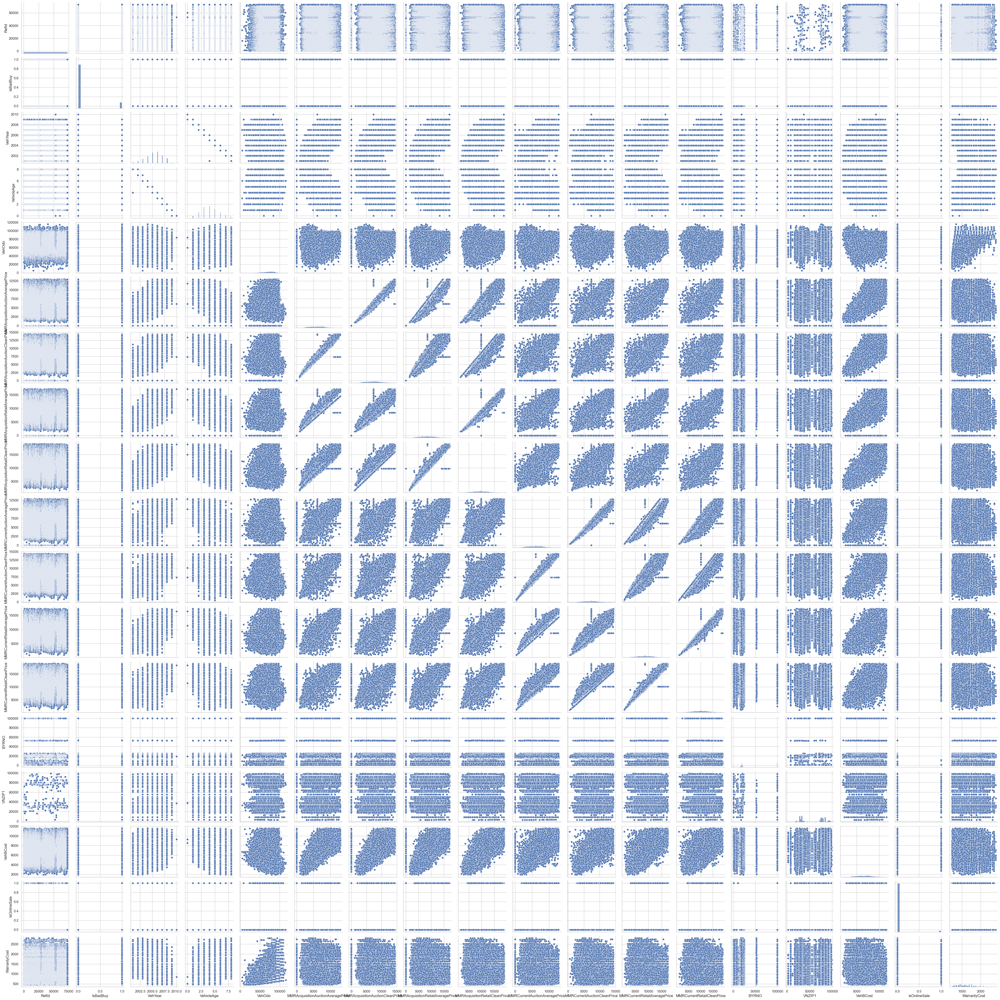

In [19]:
############################################
# Pair Plot
############################################

warnings.filterwarnings('ignore', category=FutureWarning) # avoid error message

sns.pairplot(df_car)

,RefId,IsBadBuy,VehYear,VehicleAge,VehOdo,MMRAcquisitionAuctionAveragePrice,MMRAcquisitionAuctionCleanPrice,MMRAcquisitionRetailAveragePrice,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,VehBCost,WarrantyCost
RefId,1.000000,0.023973,0.010580,-0.024085,-0.026553,-0.012372,-0.017499,-0.032473,-0.036526,-0.008909,-0.014365,-0.023559,-0.025831,-0.013421,-0.026536
IsBadBuy,0.023973,1.000000,-0.158886,0.157928,0.082560,-0.121264,-0.115161,-0.095843,-0.096054,-0.119674,-0.118558,-0.115509,-0.112453,-0.109663,0.042855
VehYear,0.010580,-0.158886,1.000000,-0.926523,-0.283719,0.588461,0.538097,0.583613,0.572482,0.597374,0.568325,0.615761,0.578107,0.356171,-0.242988
VehicleAge,-0.024085,0.157928,-0.926523,1.000000,0.317323,-0.555850,-0.504787,-0.453464,-0.442782,-0.564672,-0.535936,-0.511387,-0.477053,-0.303203,0.222695
VehOdo,-0.026553,0.082560,-0.283719,0.317323,1.000000,-0.023809,0.010565,0.029185,0.061318,-0.035961,-0.000022,0.014910,0.045820,-0.057340,0.457655
MMRAcquisitionAuctionAveragePrice,-0.012372,-0.121264,0.588461,-0.555850,-0.023809,1.000000,0.973441,0.892352,0.845602,0.918465,0.884026,0.825102,0.821337,0.773041,0.005242
MMRAcquisitionAuctionCleanPrice,-0.017499,-0.115161,0.538097,-0.504787,0.010565,0.973441,1.000000,0.875464,0.838527,0.897315,0.881249,0.798741,0.809723,0.760100,0.034713
MMRAcquisitionRetailAveragePrice,-0.032473,-0.095843,0.583613,-0.453464,0.029185,0.892352,0.875464,1.000000,0.937840,0.825553,0.789784,0.874294,0.864683,0.731104,-0.008338
MMRAcquisitonRetailCleanPrice,-0.036526,-0.096054,0.572482,-0.442782,0.061318,0.845602,0.838527,0.937840,1.000000,0.812823,0.835002,0.908304,0.912005,0.769288,0.020808
MMRCurrentAuctionAveragePrice,-0.008909,-0.119674,0.597374,-0.564672,-0.035961,0.918465,0.897315,0.825553,0.812823,1.000000,0.950376,0.868715,0.862294,0.759995,-0.000620


------------------------------------------------------------------------------------------------------------------------


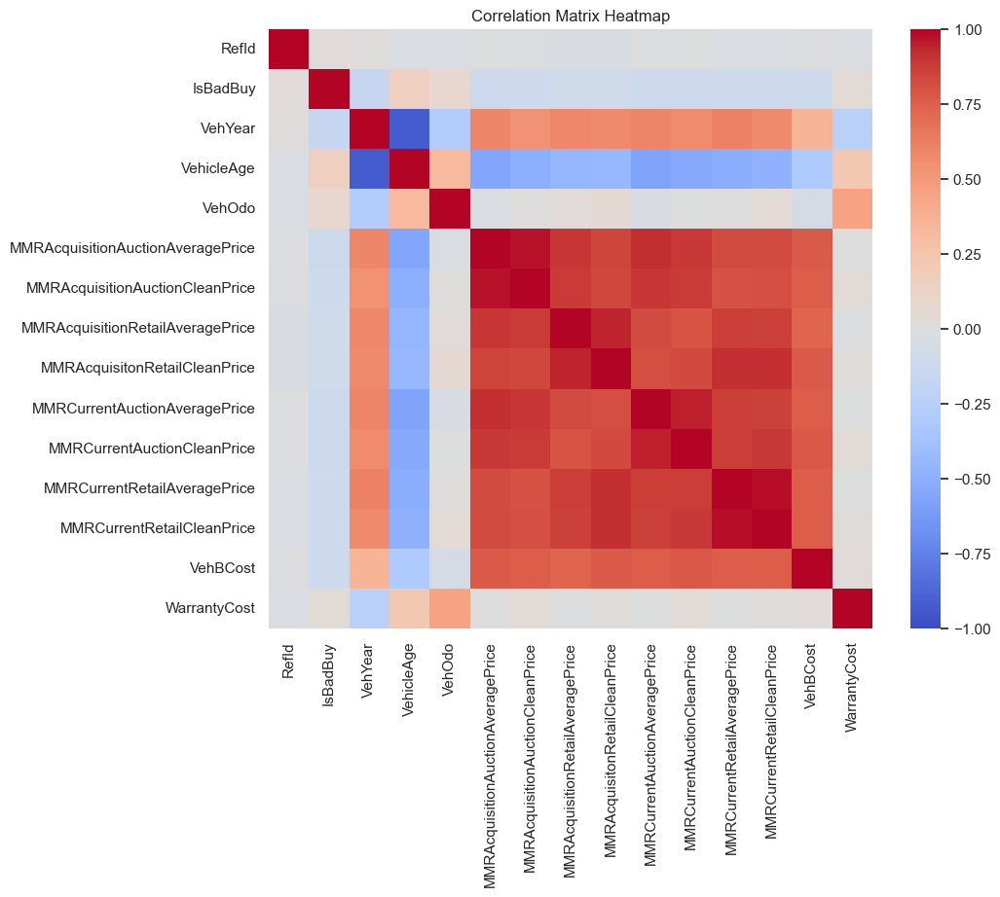

In [20]:
############################################
# Correlation matrix and heatmap
############################################
# Select only numeric columns
numeric_cols = df_car.select_dtypes(include=['float64', 'int64'])

correlation_matrix = numeric_cols.corr()
display(correlation_matrix)

print('------------------------------------------------------------------------------------------------------------------------')

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation Matrix Heatmap')
plt.show()

The frequency of the different categories is:
 IsBadBuy
0    64007
1     8976
Name: count, dtype: int64

Percentage distribution of categories:
IsBadBuy
0    87.701245
1    12.298755
Name: count, dtype: float64


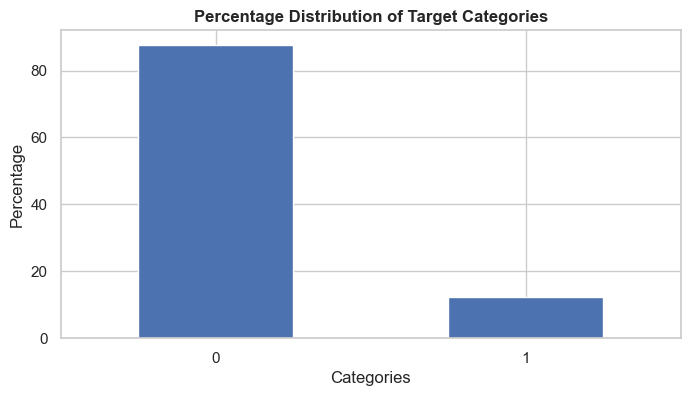

In [21]:
############################################
# Checking if the target ('IsBadBuy' variable evenly- or unevenly distributed throuch 'df'
############################################

# import pandas as pd

# Counting instances of each category in  target variable
cat_freq = df_car['IsBadBuy'].value_counts()

# Display the frequencies
print('The frequency of the different categories is:\n', cat_freq)

# Calculate the percentage of each category
percentage = (cat_freq / len(df_car)) * 100
print("\nPercentage distribution of categories:")
print(percentage)

#########################################################################################
# Visualization 

plt.figure(figsize=(8, 4))
percentage.plot(kind='bar')
plt.title('Percentage Distribution of Target Categories', fontweight='bold')
plt.xlabel('Categories')
plt.ylabel('Percentage')
plt.xticks(rotation=0)  # rotation=0 --> to display category names horizontally
plt.show()

######################################################################
# Part 2 Machine Learning Prediction 
######################################################################

In [22]:
############################################
# Train-test-split
############################################

#reading in the dataframe again to remove previous changes
df_car = pd.read_csv(file_path_2 , na_values = 'null')

############################################
# Actual train-test split
target = df_car.loc[:,'IsBadBuy']
features = df_car.drop('IsBadBuy', axis=1)

features_train, features_test, target_train, target_test = train_test_split(features, target, 
                                                                            random_state=42,
                                                                            test_size=0.1)
############################################
# Train-test-split:
# allows you to evaluate how well your model generalizes to new, unseen data.
# you can assess whether the model has overfitted and if it performs well on new data.
# The test set remains untouched until the final evaluation, ensuring unbiased performance metrics
# The test set serves as a simulation of ta real-world scenario, providing insights into how your model will perform in 
# real-world applications

In [23]:
############################################
# Saving split features_test/train and target_test/train datasets 
############################################
# Save features_test as 'features_test.csv'
features_test.to_csv('features_test.csv', index=False)

############################################
# saving features_train and target_train
features_train.to_csv('features_train.csv', index=False)
target_train.to_csv('target_train.csv', index=False)

In [24]:
############################################
# Data Preparation
# Data type transformation
############################################

def transform_dtypes(df_car):
    """
    Transforms the data types of *specified columns* in the DataFrame.
    * The specified columns are: 'PurchDate', 'WheelTypeID', 'IsOnlineSale', 
    'MMRAcquisitionAuctionAveragePrice' to 'MMRCurrentRetailCleanPrice', 
    'VehBCost', 'BYRNO', 'VNZIP1'
    
    Parameters:
    df: The used car purchase DataFrame whose data types are to be transformed.
    
    Returns:
    pd.DataFrame: DataFrame df with transformed data types.
    """
    # Convert 'PurchDate' to datetime (sec)
    df_car['PurchDate'] = pd.to_datetime(df_car['PurchDate'], unit='s')

    # Convert categorical 'WheelTypeID', 'IsOnlineSale' from int to category as per data dict
    categorical_columns = ['WheelTypeID', 'IsOnlineSale']
    for col in categorical_columns:
        df_car[col] = df_car[col].astype('category')

    # Price-related columns: converting from float64 to int, ignoring errors for NaN
    price_columns = ['MMRAcquisitionAuctionAveragePrice','MMRAcquisitionAuctionCleanPrice', 'MMRAcquisitionRetailAveragePrice', 
                     'MMRAcquisitonRetailCleanPrice', 'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice',
                     'MMRCurrentRetailAveragePrice',
                     'MMRCurrentRetailCleanPrice']
    
    for col in price_columns:
        df_car[col] = df_car[col].astype('int', errors='ignore')

    # Other conversions
    df_car['VehBCost'] = df_car['VehBCost'].astype('int', errors='ignore')
    df_car['BYRNO'] = df_car['BYRNO'].astype('category')
    df_car['VNZIP1'] = df_car['VNZIP1'].astype('category')

    # Return the modified DataFrame
    return df_car

In [25]:
############################################
# Summary stat for num_columns
############################################

display(df_car[num_columns].describe().T)

,count,mean,std,min,25%,50%,75%,max
VehYear,72983.0,2005.343052,1.731252,2001.0,2004.0,2005.0,2007.0,2010.0
VehicleAge,72983.0,4.176644,1.712210,0.0,3.0,4.0,5.0,9.0
VehOdo,72983.0,71499.995917,14578.913128,4825.0,61837.0,73361.0,82436.0,115717.0
VehBCost,72983.0,6730.934326,1767.846435,1.0,5435.0,6700.0,7900.0,45469.0
WarrantyCost,72983.0,1276.580985,598.846788,462.0,837.0,1155.0,1623.0,7498.0
MMRAcquisitionAuctionAveragePrice,72965.0,6128.909217,2461.992768,0.0,4273.0,6097.0,7765.0,35722.0
MMRAcquisitionAuctionCleanPrice,72965.0,7373.636031,2722.491986,0.0,5406.0,7303.0,9021.0,36859.0
MMRAcquisitionRetailAveragePrice,72965.0,8497.034332,3156.285284,0.0,6280.0,8444.0,10651.0,39080.0
MMRAcquisitonRetailCleanPrice,72965.0,9850.928240,3385.789541,0.0,7493.0,9789.0,12088.0,41482.0
MMRCurrentAuctionAveragePrice,72668.0,6132.081287,2434.567723,0.0,4275.0,6062.0,7736.0,35722.0


In [26]:
############################################
# .dtypes for num_columns
############################################
display(df_car[num_columns].dtypes)

VehYear                                int64
VehicleAge                             int64
VehOdo                                 int64
VehBCost                             float64
WarrantyCost                           int64
MMRAcquisitionAuctionAveragePrice    float64
MMRAcquisitionAuctionCleanPrice      float64
MMRAcquisitionRetailAveragePrice     float64
MMRAcquisitonRetailCleanPrice        float64
MMRCurrentAuctionAveragePrice        float64
MMRCurrentAuctionCleanPrice          float64
MMRCurrentRetailAveragePrice         float64
MMRCurrentRetailCleanPrice           float64
dtype: object

In [27]:
############################################
# Apply dtype conversion to reduce memory usage
############################################

# Create a temporary copy of 'df' 
df_temp = df_car.copy()

# 'VehYear', 'VehicleAge', 'WarrantyCost', 'VehOdo'
df_car['VehYear'] = df_car['VehYear'].astype('uint16')
df_car['VehicleAge'] = df_car['VehicleAge'].astype('uint8')
df_car['WarrantyCost'] = df_car['WarrantyCost'].astype('uint16')
df_car['VehOdo'] = df_car['VehOdo'].astype('uint16')
##########################################################
# MMRA price columns

price_columns = ['MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice',
                 'MMRAcquisitionRetailAveragePrice', 'MMRAcquisitonRetailCleanPrice',
                 'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice',
                 'MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice']

# impute NaN with median
for column in price_columns:
    median_value = df_car[column].median()
    df_car[column] = df_car[column].fillna(median_value)

# convert to 'uint16'
for col in price_columns:
    df_car[col] = df_car[col].astype('uint16')

##########################################################   
# New memory usage after conversion
print("\n New memory usage after conversion:")
display(df_car.memory_usage(deep=True))
#  deep=True more accurately computes the actual memory usage of the DataFrame elements.


 New memory usage after conversion:


Index                                    132
RefId                                 583864
IsBadBuy                              583864
PurchDate                            4815517
Auction                              4607032
VehYear                               145966
VehicleAge                             72983
Make                                 4629411
Model                                5161909
Trim                                 4275209
SubModel                             5050344
Color                                4507056
Transmission                         4456854
WheelTypeID                           583864
WheelType                            4464240
VehOdo                                145966
Nationality                          4789576
Size                                 4653246
TopThreeAmericanName                 4506736
MMRAcquisitionAuctionAveragePrice     145966
MMRAcquisitionAuctionCleanPrice       145966
MMRAcquisitionRetailAveragePrice      145966
MMRAcquisi

In [28]:
############################################
# Dealing with NaNs after train-test split - impute Nan by setting them to unknown 
############################################

# Ensuring that the split data are independent copies to avoid 'SettingWithCopyWarning'
features_train = features_train.copy()
features_test = features_test.copy()

# Categorical columns
cat_cols_nan = ['Trim', 'SubModel', 'Color', 'Transmission', 'WheelTypeID', 
                'WheelType', 'Nationality', 'Size', 'TopThreeAmericanName', 
                'PRIMEUNIT', 'AUCGUART', 'BYRNO', 'VNZIP1', 'VNST']

for column in cat_cols_nan:
    # Fill NaN values with 'Unknown'
    features_train.loc[:, column] = features_train.loc[:, column].fillna('Unknown')
    features_test.loc[:, column] = features_test.loc[:, column].fillna('Unknown')

########################################################################################
# Numerical columns
num_cols_nan = ['MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice',
                'MMRAcquisitionRetailAveragePrice', 'MMRAcquisitonRetailCleanPrice',
                'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice',
                'MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice', 'VehBCost']

for column in num_cols_nan:
    median_value = features_train[column].median()
    # Apply median to fill NaNs (using .loc to avoid error)
    features_train.loc[:, column] = features_train.loc[:, column].fillna(median_value)
    features_test.loc[:, column] = features_test.loc[:, column].fillna(median_value)

In [29]:
############################################
# Dealing with Outliers after train-test split
# First identify the median absolute deviation (MAD)
############################################

# Making sure that the split data are independent copies to avoid 'SettingWithCopyWarning'
features_train = features_train.copy()
features_test = features_test.copy()

outlier_num_cols = ['MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice',
                    'MMRAcquisitionRetailAveragePrice', 'MMRAcquisitonRetailCleanPrice',
                    'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice',
                    'MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice',
                    'VehicleAge', 'VehBCost', 'WarrantyCost']

# Calculating the MAD for each specified column from features_train to avoid data leakage!
for column in outlier_num_cols:
    if column in features_train.columns:  # This ensures that the column exists to prevent KeyError
        median = features_train[column].median()
        mad = (features_train[column] - median).abs().median()
        print('MAD for {col}: {mad_value:.2f}'.format(col=column, mad_value=mad))

MAD for MMRAcquisitionAuctionAveragePrice: 1742.00
MAD for MMRAcquisitionAuctionCleanPrice: 1789.00
MAD for MMRAcquisitionRetailAveragePrice: 2190.00
MAD for MMRAcquisitonRetailCleanPrice: 2299.00
MAD for MMRCurrentAuctionAveragePrice: 1719.50
MAD for MMRCurrentAuctionCleanPrice: 1784.00
MAD for MMRCurrentRetailAveragePrice: 2171.00
MAD for MMRCurrentRetailCleanPrice: 2246.00
MAD for VehicleAge: 1.00
MAD for VehBCost: 1230.00
MAD for WarrantyCost: 339.00


**My observation**

* Especially the MMRA values show high MAD
* It is noticeable that the MMR clean prices are higher than the Clean Prices

In [30]:
############################################
# Deal with outliers after train-test split
# Cappning outliers by setting threshhold
############################################

# Making sure that the split data are independent copies. This avoids 'SettingWithCopyWarning'
features_train = features_train.copy()
features_test = features_test.copy()

outlier_num_cols = ['MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionAuctionCleanPrice',
    'MMRAcquisitionRetailAveragePrice', 'MMRAcquisitonRetailCleanPrice',
    'MMRCurrentAuctionAveragePrice', 'MMRCurrentAuctionCleanPrice',
    'MMRCurrentRetailAveragePrice', 'MMRCurrentRetailCleanPrice',
    'VehicleAge', 'VehBCost', 'WarrantyCost']

# Setting the threshold for outlier detection
threshold = 3  # I'm setting this 3 times the MAD to define outliers (as it is common practice)

# Calculation and application of outlier thresholds for training data
for column in outlier_num_cols:
    if column in features_train.columns: 
        # Calculating stats on training data only
        median_train = features_train[column].median()
        mad_train = (features_train[column] - median_train).abs().median()
        upper_limit = median_train + threshold * mad_train
        lower_limit = median_train - threshold * mad_train

        # Capping outliers in training data
        features_train.loc[:, column] = np.where(features_train[column] > upper_limit, upper_limit, features_train[column])
        features_train.loc[:, column] = np.where(features_train[column] < lower_limit, lower_limit, features_train[column])

        # Apply the same thresholds to cap outliers in testing data
        features_test.loc[:, column] = np.where(features_test[column] > upper_limit, upper_limit, features_test[column])
        features_test.loc[:, column] = np.where(features_test[column] < lower_limit, lower_limit, features_test[column])

**Checking for reduntant features**

**VehYear and VehicleAge**: The correlation coefficient is -0.927150 (correlaton matrix) --> suggests a strong inverse relationship. Makes sense because older vehicles will have earlier model years. One of the two can be dropped
--> I choose VehYear

**Price Features**: Several of the MMRAcquisition and MMRCurrent price features show very high correlations among themselves. This suggests redundancy as they may be conveying similar valuation information from slightly different perspectives (average vs. clean prices).
--> I wilkl removethe average prices

**PurchDate** --> not needed <-- drop

In [31]:
############################################
# Dealing with redundant features
############################################
# List of redundant columns to drop

columns_to_drop = ['VehYear', 'MMRAcquisitionAuctionCleanPrice', 'MMRAcquisitonRetailCleanPrice', 
                   'MMRCurrentAuctionCleanPrice', 'MMRCurrentRetailCleanPrice', 'PurchDate', 'BYRNO', 
                   'VNZIP1', 'WheelTypeID', 'PRIMEUNIT', 'SubModel', 'Model', 'Trim']

# application in function clean_data(df)

# Dropping the columns from both training and testing datasets
features_train.drop(columns=columns_to_drop, inplace=True)
features_test.drop(columns=columns_to_drop, inplace=True)

############################################
# Check if the columns have been dropped
print(features_train.columns)
print(features_test.columns)

Index(['RefId', 'Auction', 'VehicleAge', 'Make', 'Color', 'Transmission',
       'WheelType', 'VehOdo', 'Nationality', 'Size', 'TopThreeAmericanName',
       'MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionRetailAveragePrice',
       'MMRCurrentAuctionAveragePrice', 'MMRCurrentRetailAveragePrice',
       'AUCGUART', 'VNST', 'VehBCost', 'IsOnlineSale', 'WarrantyCost'],
      dtype='object')
Index(['RefId', 'Auction', 'VehicleAge', 'Make', 'Color', 'Transmission',
       'WheelType', 'VehOdo', 'Nationality', 'Size', 'TopThreeAmericanName',
       'MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionRetailAveragePrice',
       'MMRCurrentAuctionAveragePrice', 'MMRCurrentRetailAveragePrice',
       'AUCGUART', 'VNST', 'VehBCost', 'IsOnlineSale', 'WarrantyCost'],
      dtype='object')


In [32]:
############################################
# Writing a 'clean_data' function to clean dataset
############################################

def clean_data(df, df_train):
    """
    Function to clean project dataframes.
    
    Args:
    df (pd.DataFrame): The DataFrame to be cleaned.
    df_train (pd.DataFrame): The training DataFrame to compute statistics for imputation.
    
    Returns:
    pd.DataFrame: The cleaned DataFrame.
    """
    # Creating a copy of the DataFrame to avoid modifying the original data
    df_clean = df.copy()
    
    # Categorical columns to fill NaN values with 'Unknown'
    cat_cols_nan = ['Trim', 'SubModel', 'Color', 'Transmission', 'WheelTypeID', 
                    'WheelType', 'Nationality', 'Size', 'TopThreeAmericanName', 
                    'PRIMEUNIT', 'AUCGUART', 'BYRNO', 'VNZIP1', 'VNST']
    for column in cat_cols_nan:
        if column in df_clean.columns:
            df_clean[column] = df_clean[column].fillna('Unknown')
    
    # Numerical columns to fill NaN values with median of training data
    num_cols_nan = ['MMRAcquisitionAuctionAveragePrice', 'MMRAcquisitionRetailAveragePrice',
                    'MMRCurrentAuctionAveragePrice', 'MMRCurrentRetailAveragePrice', 'VehBCost']
    
    for column in num_cols_nan:
        if column in df_clean.columns:
            median_value = df_train[column].median()  # Use median from training data
            df_clean[column] = df_clean[column].fillna(median_value)
        
    # Redundant columns to drop
    columns_to_drop = ['VehYear', 'PurchDate', 'BYRNO', 'MMRAcquisitionAuctionCleanPrice', 
                       'MMRAcquisitonRetailCleanPrice', 'MMRCurrentAuctionCleanPrice', 
                       'MMRCurrentRetailCleanPrice', 'VNZIP1', 'WheelTypeID', 
                       'PRIMEUNIT', 'SubModel', 'Model', 'Trim']
    
    # Dropping redundant columns that exist in the DataFrame
    columns_to_drop_existing = [col for col in columns_to_drop if col in df_clean.columns]
    df_clean.drop(columns=columns_to_drop_existing, inplace=True)
    
    return df_clean

In [33]:
#################################################################
# Initial Decison Tree Test
#################################################################
# Applying One-Hot Encoding
features_train_encoded = pd.get_dummies(features_train)
features_test_encoded = pd.get_dummies(features_test)

# Ensuring train and test sets both have same dummy columns
features_train_encoded, features_test_encoded = features_train_encoded.align(features_test_encoded, join='left', axis=1, fill_value=0)

# Decision Tree model
model_unbalanced = DecisionTreeClassifier(max_depth=12, random_state=42)
model_unbalanced.fit(features_train_encoded, target_train)
target_pred_unbalanced = model_unbalanced.predict(features_test_encoded)

print('Unbalanced Model Performance:')
print(classification_report(target_test, target_pred_unbalanced))

#################################################################
# Balanced model with class weights
model_balanced_by_class_weights = DecisionTreeClassifier(max_depth=12, class_weight='balanced', random_state=42)
model_balanced_by_class_weights.fit(features_train_encoded, target_train)
target_pred_balanced = model_balanced_by_class_weights.predict(features_test_encoded)

print('Balanced Model Performance:')
print(classification_report(target_test, target_pred_balanced))

Unbalanced Model Performance:
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      6465
           1       0.65      0.24      0.35       834

    accuracy                           0.90      7299
   macro avg       0.78      0.61      0.65      7299
weighted avg       0.88      0.90      0.88      7299

Balanced Model Performance:
              precision    recall  f1-score   support

           0       0.93      0.69      0.79      6465
           1       0.21      0.63      0.31       834

    accuracy                           0.68      7299
   macro avg       0.57      0.66      0.55      7299
weighted avg       0.85      0.68      0.74      7299



**My observations:**

Improved recall for the minority class suggests that the model, with class weights adjusted, is better at identifying bad purchases, which was likely under-predicted in the unbalanced model.

Lower precision for the minority class and decreased precision for the majority class indicate more false positives for bad buys and more false negatives for non-bad buys, respectively.

Overall accuracy is lower, but the model is more sensitive to the minority class.

In [34]:
#################################################################
# GridSearch to find ideal max_depth and 'min_samples_leaf' for parameter grid
#################################################################

#from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold

# Define the model
dt = DecisionTreeClassifier(class_weight='balanced', random_state=42)

#################################################################

# Parameter grid
param_grid = {'max_depth': range(1, 21), 'min_samples_leaf': [1, 5, 10, 20]}

# 'max_depth': range(1, 21),extensive exploration of how depth influences the model's ability to generalize and 
# fit the training data.
# 'min_samples_leaf': [1, 5, 10, 20]  # Adding min_samples_leaf to control complexity (prevent overfitting and 
# excessive branch generation)

# Grid search
grid_search = GridSearchCV(dt, param_grid, cv=StratifiedKFold(5), scoring='f1_macro')
# cv=StratifiedKFold(5) --> reduce variance
# with 5 folds, the balance btw. computational cost & model evaluation reliability is commonly considered to be good
# f1_macro --> for Balance Between Precision and Recall + to handle class imbalance in the data
# f1_macro-average chosen to compute the metric independently for each class and then take the average

#################################################################
# Fitting grid search
grid_search.fit(features_train_encoded, target_train)

# Output the best parameters and score
print('Outcome GridSearch for max_depth and min_samples_leaf:')
print('Best parameters:', grid_search.best_params_)
print('Best cross-validation score: {:.2f}'.format(grid_search.best_score_))

Outcome GridSearch for max_depth and min_samples_leaf:
Best parameters: {'max_depth': 1, 'min_samples_leaf': 1}
Best cross-validation score: 0.66


**My assessment**

**GridSearch:** {'max_depth': 1, 'min_samples_leaf': 1} --> suggest a very simplistic model.  
max_depth of 1 means the tree makes only one decision. 
This prevents overfitting and ensures the model is very simple and interpretable, 
<----> it is likely too simplistic though to capture the actual patterns in this datasets.

**Cross-Validation:** 0.66 might be quite reasonable given the inbalance in the data
--> perhaps check against a simpler model

In [35]:
#################################################################
# Manual Scaling, application of SMOTE, classifier fitting
# Note: I chose a manual approach as my pipeline didn't work well due to compatibility issues between scikit-learn and imblearn. 
#################################################################

# One-Hot Encoding and alignment of train and test feature sets
features_train_encoded = pd.get_dummies(features_train)
features_test_encoded = pd.get_dummies(features_test)

features_train_encoded, features_test_encoded = features_train_encoded.align(features_test_encoded, join='left', 
                                                                             axis=1, fill_value=0)  # Fill value added for missing columns

#################################################################
# Manual scaling
scaler = StandardScaler()
features_train_scaled = scaler.fit_transform(features_train_encoded)
features_test_scaled = scaler.transform(features_test_encoded)

# Apply SMOTE to the scaled training data
smote = SMOTE()
print("Applying SMOTE...")
try:
    features_train_resampled, target_train_resampled = smote.fit_resample(features_train_scaled, target_train)
    print("SMOTE application successful. Resampled shapes:", features_train_resampled.shape, target_train_resampled.shape)
except Exception as e:
    print("Error during SMOTE application:", str(e))

# Fit the classifier
classifier = DecisionTreeClassifier(max_depth=12, class_weight='balanced', min_samples_leaf=1, random_state=42)
print("Fitting the classifier...")
try:
    classifier.fit(features_train_resampled, target_train_resampled)
    print("Classifier fit successful.")
except Exception as e:
    print("Error during classifier fitting:", str(e))

# Predictions and evaluation
print("Making predictions...")
try:
    target_pred = classifier.predict(features_test_scaled)
    print("Predictions successful.")
except Exception as e:
    print("Error during prediction:", str(e))

#################################################################
# Classification report
try:
    report = classification_report(target_test, target_pred)
    print("Classification report:\n", report)
except Exception as e:
    print("Error generating classification report:", str(e))

Applying SMOTE...
SMOTE application successful. Resampled shapes: (115084, 134) (115084,)
Fitting the classifier...
Classifier fit successful.
Making predictions...
Predictions successful.
Classification report:
               precision    recall  f1-score   support

           0       0.91      0.96      0.94      6465
           1       0.49      0.29      0.36       834

    accuracy                           0.88      7299
   macro avg       0.70      0.62      0.65      7299
weighted avg       0.86      0.88      0.87      7299



**My assessment:**

While the model seems to perform well in identifying the majority class (0), it struggles with the minority class 
(1 = IsBadBuy) by comparison 

In [36]:
#################################################################
# 'Decision Tree Resampling Strategies'

# This code involves training and evaluating a decision tree classifier 
# under different sampling strategies to handle class imbalance

# Note: I chose a manual approach as my pipeline didn't work well due to compatibility issues between scikit-learn and imblearn. 
#################################################################
# OneHotEncoding done in cell above

# Aligning the feature sets to ensure they have the same dummy columns using 'outer' join
features_train_encoded, features_test_encoded = features_train_encoded.align(features_test_encoded, join='outer', axis=1, fill_value=0)
#################################################################
# Decision Tree (Class Weighted)
dt_class_weight = DecisionTreeClassifier(class_weight='balanced', max_depth=1, min_samples_leaf=1, random_state=42)
dt_class_weight.fit(features_train_encoded, target_train)
predictions = dt_class_weight.predict(features_test_encoded)
print("Decision Tree with Class Weights")
print("f1 on Validation set: {:.2f}".format(f1_score(target_test, predictions)))
print("precision: {:.2f}".format(precision_score(target_test, predictions)))
print("recall: {:.2f}\n".format(recall_score(target_test, predictions)))
#################################################################
# SMOTE
smote = SMOTE(random_state=42)
print("Applying SMOTE...")
features_train_resampled, target_train_resampled = smote.fit_resample(features_train_encoded, target_train)
print("SMOTE application successful. Resampled shapes:", features_train_resampled.shape, target_train_resampled.shape)

dt_smote = DecisionTreeClassifier(max_depth=1, min_samples_leaf=1, random_state=42)
dt_smote.fit(features_train_resampled, target_train_resampled)
predictions = dt_smote.predict(features_test_encoded)
print("Minority oversampling with SMOTE")
print("f1 on Validation set: {:.2f}".format(f1_score(target_test, predictions)))
print("precision: {:.2f}".format(precision_score(target_test, predictions)))
print("recall: {:.2f}\n".format(recall_score(target_test, predictions)))
#################################################################
# Random Undersampling
undersampler = RandomUnderSampler(random_state=42)
print("Applying Random Undersampling...")
features_train_resampled, target_train_resampled = undersampler.fit_resample(features_train_encoded, target_train)
print("Random Undersampling application successful. Resampled shapes:", features_train_resampled.shape, target_train_resampled.shape)

dt_undersample = DecisionTreeClassifier(max_depth=1, min_samples_leaf=1, random_state=42)
dt_undersample.fit(features_train_resampled, target_train_resampled)
predictions = dt_undersample.predict(features_test_encoded)
print("Random Undersampling")
print("f1 on Validation set: {:.2f}".format(f1_score(target_test, predictions)))
print("precision: {:.2f}".format(precision_score(target_test, predictions)))
print("recall: {:.2f}\n".format(recall_score(target_test, predictions)))

################################################################# 
# Note:
# Random undersampling to randomly remove instances from the majority class to equalize the class 
# distribution with the minority class. This is to reduce the number of samples in the dataset to 
# balance the classes.
#################################################################

Decision Tree with Class Weights
f1 on Validation set: 0.36
precision: 0.69
recall: 0.25

Applying SMOTE...
SMOTE application successful. Resampled shapes: (115084, 134) (115084,)
Minority oversampling with SMOTE
f1 on Validation set: 0.36
precision: 0.69
recall: 0.25

Applying Random Undersampling...
Random Undersampling application successful. Resampled shapes: (16284, 134) (16284,)
Random Undersampling
f1 on Validation set: 0.36
precision: 0.69
recall: 0.25



**My observations**

**Decision Tree with Class Weights** and **Random Undersampling:** 
 Both provide a higher precision but lower recall --> This means they are accurate when predicting positive cases but miss a significant number of actual positives.

**Minority Oversampling with SMOTE** 
Here, recall is  significantly increased -->  meaning it identifies more positive cases, 
<----> but it does so at the cost of lower precision, leading to more false positives.

In [37]:
#################################################################
# Modelling
# As a stratigic approach I choose three baseline models (log Regression, Decision Tree, KNN)
#################################################################

# Define numerical and categorical columns for usage 
num_cols = ['VehicleAge', 'VehOdo', 'VehBCost', 'WarrantyCost', 'MMRAcquisitionAuctionAveragePrice', 
            'MMRAcquisitionRetailAveragePrice', 'MMRCurrentAuctionAveragePrice', 
            'MMRCurrentRetailAveragePrice']
cat_cols = ['Make', 'Color', 'Transmission', 'WheelType', 'Nationality', 
            'TopThreeAmericanName', 'AUCGUART', 'VNST']

# Preprocessing for numerical data
numerical_transformer = StandardScaler()

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Combine preprocessing steps
preprocessor = ColumnTransformer(transformers=[('num', numerical_transformer, num_cols), ('cat', categorical_transformer, cat_cols)])

# Preprocess the training data
features_train_preprocessed = preprocessor.fit_transform(features_train)
features_test_preprocessed = preprocessor.transform(features_test)

# Apply SMOTE
smote = SMOTE(random_state=42)
features_train_resampled, target_train_resampled = smote.fit_resample(features_train_preprocessed, target_train)

# Define models
model_logreg = LogisticRegression(solver='lbfgs', class_weight='balanced', penalty='l2', 
                                  max_iter=int(1e4), random_state=42, n_jobs=-1)
model_knn = KNeighborsClassifier(n_neighbors=5, weights='distance')
dt = DecisionTreeClassifier(class_weight='balanced', max_depth=1, min_samples_leaf=1, random_state=42)

# Fit models
model_logreg.fit(features_train_resampled, target_train_resampled)
dt.fit(features_train_resampled, target_train_resampled)
model_knn.fit(features_train_resampled, target_train_resampled)

#################################################################
# Function to predict and evaluate
def evaluate_model(model, features_test, target_test):
    predictions = model.predict(features_test)
    print("f1 on Validation set: {:.2f}".format(f1_score(target_test, predictions)))
    print("precision: {:.2f}".format(precision_score(target_test, predictions)))
    print("recall: {:.2f}\n".format(recall_score(target_test, predictions)))
#################################################################

print("Logistic Regression:")
evaluate_model(model_logreg, features_test_preprocessed, target_test)

print("Decision Tree:")
evaluate_model(dt, features_test_preprocessed, target_test)

print("KNN:")
evaluate_model(model_knn, features_test_preprocessed, target_test)

Logistic Regression:
f1 on Validation set: 0.35
precision: 0.24
recall: 0.62

Decision Tree:
f1 on Validation set: 0.36
precision: 0.69
recall: 0.25

KNN:
f1 on Validation set: 0.28
precision: 0.19
recall: 0.54



**My observation**

- All models demonstrate a struggle with precision for the minority class while achieving relatively high recall rates. 
- I assume this because the models are tuned to prioritize sensitivity (catching as many positive cases as possible) over precision.

**Decision**

K-Nearest Neighbors (KNN) shows the best balance btw. recall & precision for the minority class
The F1-score isn't significantly lower than log. Regression & DT.
I assume the combination of recall and precision makes it a more suitable candidate for handling class imbalance effectively.

In [38]:
#################################################################
# Defining a feature engineering function (engineer_features)
#################################################################

def engineer_features(df):
    # LabelEncoder object
    le = LabelEncoder()

    # Encode 'VNST' column
    if 'VNST' in features_train.columns and 'VNST' in features_test.columns:
        features_train['VNST'] = le.fit_transform(features_train['VNST'])
        features_test['VNST'] = le.transform(features_test['VNST'])
        #features_train.drop('VNST', axis=1, inplace=True)
        #features_test.drop('VNST', axis=1, inplace=True)


    return df

In [39]:
#################################################################
# Data Scaling using Column Transformer
#################################################################

# Define numerical and categorical columns for usage 
#num_cols = ['VehicleAge', 'VehOdo', 'VehBCost', 'WarrantyCost', 'MMRAcquisitionAuctionAveragePrice', 
#            'MMRAcquisitionRetailAveragePrice', 'MMRCurrentAuctionAveragePrice', 
#            'MMRCurrentRetailAveragePrice']
#cat_cols = ['Make', 'Color', 'Transmission', 'WheelType', 'Nationality', 
#            'TopThreeAmericanName', 'AUCGUART', 'VNST']

# Preprocessing steps for the ColumnTransformer (num_cols/cat_cols already defined)
preprocessor = ColumnTransformer(transformers=[
    ('num', StandardScaler(), num_cols),  # scale numerical features (Essential for KNN)
    ('cat', OneHotEncoder(handle_unknown='ignore'), cat_cols)])  # OneHot encoding of categorical features

# Preprocessing the training and test data
features_train_preprocessed = preprocessor.fit_transform(features_train)
features_test_preprocessed = preprocessor.transform(features_test)

# SMOTE
smote = SMOTE(random_state=42)
features_train_resampled, target_train_resampled = smote.fit_resample(features_train_preprocessed, target_train)

# Setting up a pipeline with KNN as the classifier (no SMOTE here, since we applied it manually)
pipeline = Pipeline([('classifier', KNeighborsClassifier())])

# Fitting the pipeline on the resampled training data
pipeline.fit(features_train_resampled, target_train_resampled)

#################################################################
# Predictions and classification report
predictions = pipeline.predict(features_test_preprocessed)
print('Classification Report for KNN:')
print(classification_report(target_test, predictions))

Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.92      0.69      0.79      6465
           1       0.18      0.55      0.28       834

    accuracy                           0.67      7299
   macro avg       0.55      0.62      0.53      7299
weighted avg       0.84      0.67      0.73      7299



In [40]:
#################################################################
# PCA-EnhancedPipeline Test using KNN
#################################################################

# Most correlating numerical columns (excluding 'VehicleYear' as negatively correlated with 'VehicleAge')
cor_num_cols = ['VehicleAge', 'MMRAcquisitionAuctionAveragePrice', 
                'MMRAcquisitionRetailAveragePrice', 'MMRCurrentAuctionAveragePrice', 
                'MMRCurrentRetailAveragePrice', 'VehBCost']

# Extract categorical columns
cat_cols = features_train.select_dtypes(include=['object']).columns.tolist()

# Preprocessing for numerical data: scaling and PCA only on highly correlating features
num_transformer = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=0.95))])  # Keeping 95% of the variance to reduce dimensionality

# Preprocessing for categorical data: one-hot encoder
cat_transformer = OneHotEncoder(handle_unknown='ignore')
#categorical_transformer = Pipeline(steps=[
#    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Combining the preprocessing steps
preprocessor = ColumnTransformer(transformers=[('num', num_transformer, cor_num_cols),('cat', cat_transformer, cat_cols)])

# Apply preprocessing to the training data
features_train_preprocessed = preprocessor.fit_transform(features_train)
features_test_preprocessed = preprocessor.transform(features_test)

# Apply SMOTE
smote = SMOTE(random_state=42)
features_train_resampled, target_train_resampled = smote.fit_resample(features_train_preprocessed, target_train)

# Setting up a pipeline with KNN as the classifier (no SMOTE here, we already applied it manually)
pipeline_pca = Pipeline([
    ('classifier', KNeighborsClassifier())])

# Fit the pipeline on the resampled training data
pipeline_pca.fit(features_train_resampled, target_train_resampled)

#################################################################
# Predictions and classification report
predictions = pipeline_pca.predict(features_test_preprocessed)
print('Predictions with PCA-KNN pipeline:')
print(predictions)
print('---------------------------------------------------------')
print('Classification Report for PCA-KNN:')
print(classification_report(target_test, predictions))

Predictions with PCA-KNN pipeline:
[1 1 0 ... 1 0 0]
---------------------------------------------------------
Classification Report for PCA-KNN:
              precision    recall  f1-score   support

           0       0.92      0.69      0.79      6465
           1       0.19      0.55      0.28       834

    accuracy                           0.68      7299
   macro avg       0.55      0.62      0.54      7299
weighted avg       0.84      0.68      0.73      7299



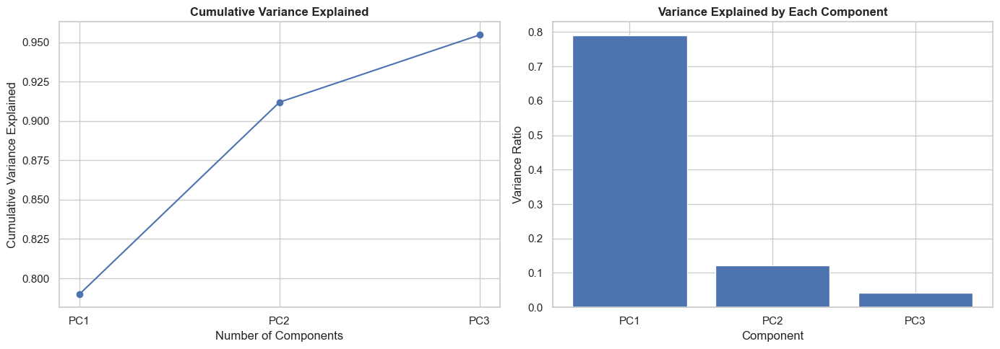

In [41]:
#################################################################
# Visualizing PCA Component Variance
#################################################################
# Extraction of PCA components
pca = preprocessor.named_transformers_['num'].named_steps['pca']

# Variance explained by each component
variance_explained = pca.explained_variance_ratio_

#################################################################
# Plotting the cumulative variance
cumulative_variance = np.cumsum(variance_explained)

# Creating plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

#################################################################
# Line graph for cumulative variance
ax1.plot(cumulative_variance, marker='o')
ax1.set_title('Cumulative Variance Explained', fontweight='bold')
ax1.set_xlabel('Number of Components')
ax1.set_ylabel('Cumulative Variance Explained')
ax1.set_xticks(range(len(cumulative_variance)))
ax1.set_xticklabels(['PC{}'.format(i + 1) for i in range(len(cumulative_variance))])

# Bar plot for variance ratio
ax2.bar(range(len(variance_explained)), variance_explained)
ax2.set_title('Variance Explained by Each Component', fontweight='bold')
ax2.set_xlabel('Component')
ax2.set_ylabel('Variance Ratio')
ax2.set_xticks(range(len(variance_explained)))
ax2.set_xticklabels(['PC{}'.format(i + 1) for i in range(len(variance_explained))])

#################################################################
plt.tight_layout()
plt.show()

In [42]:
#################################################################
# Testing the PCA-EnhancedPipeline 
#################################################################

# Predictions with PCA-KNN pipeline
predictions = pipeline_pca.predict(features_test_preprocessed)

# Calculation of metrics
accuracy = accuracy_score(target_test, predictions)
precision = precision_score(target_test, predictions, average='macro')  # Ensure to specify average method
recall = recall_score(target_test, predictions, average='macro')
f1 = f1_score(target_test, predictions, average='macro')
conf_mat = confusion_matrix(target_test, predictions)

#################################################################
# Outputting the metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:\n", conf_mat)

Accuracy: 0.6762570215097958
Precision: 0.5549295881456315
Recall: 0.6209067085079036
F1 Score: 0.5352947181653047
Confusion Matrix:
 [[4478 1987]
 [ 376  458]]


**My Observations:**

- precision (0.56) --> predicts positive (1/IsBadBuy) class over 50% of the time
- recall (0.62) --> model identifies ca. 61% of all positive cases
- f1 score (0.55) --> positive class captured in a balanced way, could be better though
- Confusion matrix: model failed to identify 431 actually positive cases opposed to 415 correctly identified cases

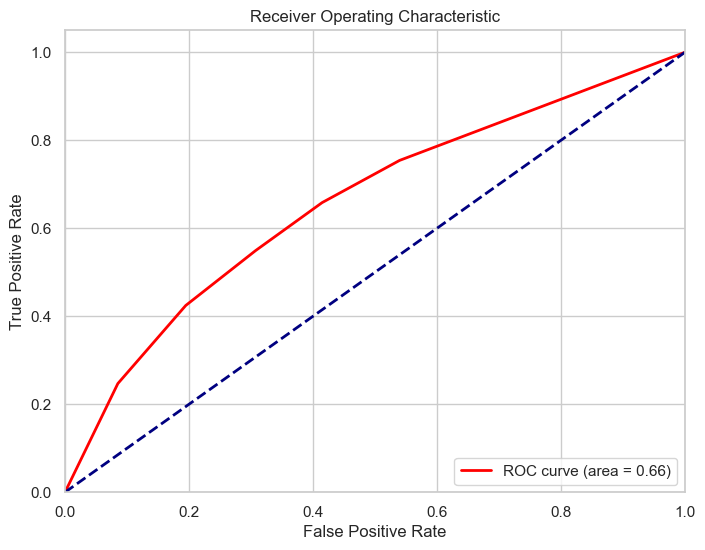

ROC AUC Score: 0.6589338274160255


In [43]:
#################################################################
# ROC-AUC score evaluation
#################################################################

# Predicting probabilities for the test data
probabilities = pipeline_pca.predict_proba(features_test_preprocessed)[:, 1]

# Calculate ROC AUC metrics
fpr, tpr, thresholds = roc_curve(target_test, probabilities)
roc_auc = roc_auc_score(target_test, probabilities)

# Plotting the ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='red', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

#################################################################
# Print the ROC AUC Score
print("ROC AUC Score:", roc_auc)

**My observation**

The ROC AUC score indicates moderate discrimination ability of my model
--> it correctly ranks a positive instance over a negative one about 65% of the time and so suggests room for improvement.

In [44]:
#################################################################
# Determine Original Feature Importance from PCA pipeline
#################################################################

features_train_scaled = StandardScaler().fit_transform(features_train[num_cols])

# Fit PCA
pca = PCA(n_components=0.95)
pca.fit(features_train_scaled)

# Get the absolute square of each loading vector
loading_squares = np.square(pca.components_.T)  # Transposing to get features as rows

# Sum across all components for each feature
feature_importances = np.sum(loading_squares, axis=1)

# Normalize to get relative importances
feature_importances /= np.sum(feature_importances)

# Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({'Feature': num_cols, 
                                      'Importance': feature_importances}).sort_values(by='Importance', ascending=False)

#################################################################
print(feature_importance_df)

                             Feature  Importance
3                       WarrantyCost    0.199590
1                             VehOdo    0.199268
0                         VehicleAge    0.182555
2                           VehBCost    0.175065
5   MMRAcquisitionRetailAveragePrice    0.090956
7       MMRCurrentRetailAveragePrice    0.071855
4  MMRAcquisitionAuctionAveragePrice    0.040439
6      MMRCurrentAuctionAveragePrice    0.040271


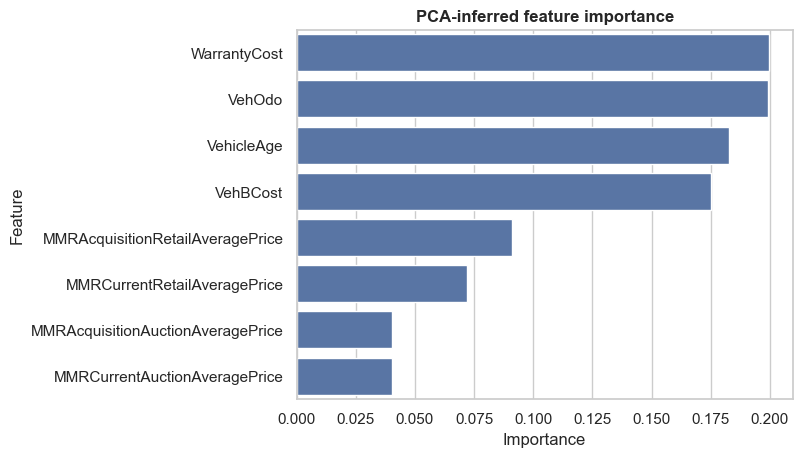

In [45]:
#################################################################
# Visualizing the PCA-inferred feature importance
#################################################################

sns.barplot(data=feature_importance_df, x='Importance', y='Feature')
plt.title('PCA-inferred feature importance', fontweight='bold')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

**Conclusion**

I am swwitching to a Random Forest pipeline after evaluating the performance of other models like KNN, logistic regression, and decision trees. While these models showed reasonable recall for the minority class, their precision was low, especially with KNN and decision trees, which led to poor F1-scores. Random Forest, being an ensemble method, should provide a better balance between precision and recall, especially in handling class imbalance. Its robustness, ability to capture non-linear relationships, and potential for improved generalization could make it a more suitable choice for enhancing both the precision of positive class predictions and overall model performance.

In [46]:
################################################################
# Building a Random Forest pipeline
#################################################################

# Import required modules
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

# Create the preprocessing steps for the ColumnTransformer
preprocessor = ColumnTransformer(transformers=[
    ('num', StandardScaler(), num_cols),
    ('cat', OneHotEncoder(handle_unknown='ignore'), cat_cols)])

# Setting up a pipeline with Random Forest as the classifier and SMOTE for balancing
random_pipeline = ImbPipeline([
    ('preprocessor', preprocessor),
    ('sampler', SMOTE(random_state=42)),  # Handling class imbalance
    ('classifier', RandomForestClassifier(random_state=42))])  # Using Random Forest as the classifier

# Fit the pipeline on your training data
random_pipeline.fit(features_train, target_train)

# Making predictions and printing classification report
predictions = random_pipeline.predict(features_test)
print('Classification Report for Random Forest:')
print(classification_report(target_test, predictions))

Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      6465
           1       0.63      0.27      0.38       834

    accuracy                           0.90      7299
   macro avg       0.77      0.63      0.66      7299
weighted avg       0.88      0.90      0.88      7299



**Conclusion:**

While the model has a good accuracy (0.90) overall, the recall for the minority class (1) is still low, indicating that further improvements are needed. I decide to tune the **hyperparameters**...

In [47]:
################################################################
# tune hyperparameters via RandomizedSearchCV
#################################################################
# Note GridSearchVC on SVM tests took too long, could lead to overfitting
# That's why I tried a randomized search for the RandomForest
from sklearn.model_selection import RandomizedSearchCV
# Parameter distribution to sample from

param_distr = {'classifier__n_estimators': [100, 200, 300],
               'classifier__max_depth': [None, 10, 20]}
# Setting up the randomized search with a fixed number of iterations
random_search = RandomizedSearchCV(
    estimator=random_pipeline,
    param_distributions=param_distr,
    n_iter=9, # Number of parameter settings sampled
    cv=3, # Number of cross-validation folds
    scoring='accuracy', # Scoring metric
    verbose=2,
    random_state=42,
    n_jobs=-1) # Use all available cores

# Fit the randomized search to the data
random_search.fit(features_train, target_train)

# Output best parameters found by the search
print('Best parameters found:', random_search.best_params_)

# Making predictions using the best estimator
best_pipeline = random_search.best_estimator_
predictions = best_pipeline.predict(features_test)

# Print classification report
print('Classification Report for Optimized Random Forest:')
print(classification_report(target_test, predictions))

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV] END classifier__max_depth=None, classifier__n_estimators=300; total time= 8.9min
[CV] END classifier__max_depth=None, classifier__n_estimators=100; total time= 3.1min
[CV] END classifier__max_depth=10, classifier__n_estimators=100; total time=  31.4s
[CV] END classifier__max_depth=10, classifier__n_estimators=200; total time=  58.6s
[CV] END classifier__max_depth=10, classifier__n_estimators=200; total time= 1.0min
[CV] END classifier__max_depth=10, classifier__n_estimators=300; total time= 1.5min
[CV] END classifier__max_depth=20, classifier__n_estimators=200; total time= 3.4min
[CV] END classifier__max_depth=None, classifier__n_estimators=200; total time= 6.0min
[CV] END classifier__max_depth=10, classifier__n_estimators=300; total time= 1.5min
[CV] END classifier__max_depth=20, classifier__n_estimators=200; total time= 3.4min
[CV] END classifier__max_depth=None, classifier__n_estimators=200; total time= 6.0min
[CV] END

**Outcome of the tuning**
The hyperparameter tuning process focused on optimizing the n_estimators and max_depth of the Random Forest classifier. The best parameters found were n_estimators=300 and max_depth=None, which achieved a similar performance to the original model, with an accuracy of 90% and a weighted F1-score of 0.88. Although these adjustments marginally increased the model’s depth and number of trees, the overall results remained consistent. This suggests that the default settings of the Random Forest classifier, combined with SMOTE for class balancing, are already well-suited for the task. As such, further hyperparameter tuning may not significantly improve performance and could introduce unnecessary complexity without meaningful gains. The model’s current performance is strong, balancing precision and recall effectively, particularly for the majority class. Therefore, leaving the model as it is.

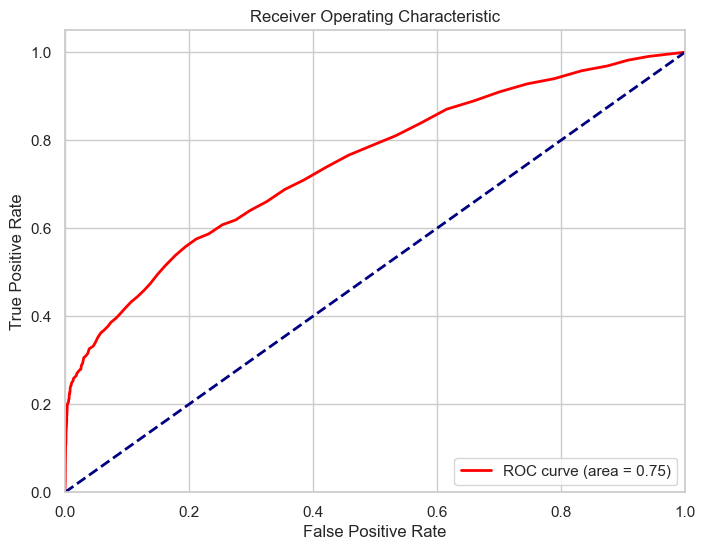

ROC AUC Score: 0.7458314554852638


In [48]:
#################################################################
# ROC-AUC score evaluation
#################################################################

# Predicting probabilities for the test data
probabilities = random_pipeline.predict_proba(features_test)[:, 1]

# Calculate ROC AUC metrics
fpr, tpr, thresholds = roc_curve(target_test, probabilities)
roc_auc = roc_auc_score(target_test, probabilities)

# Plotting the ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='red', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

#################################################################
# Print the ROC AUC Score
print("ROC AUC Score:", roc_auc)

**Assessment**
The Random Forest model with SMOTE outperforms the PCA pipeline due to its ability to effectively handle class imbalance and capture complex, non-linear relationships in the data. SMOTE addresses the imbalance by generating synthetic samples for the minority class, which helps the model learn better decision boundaries. Additionally, Random Forest is robust against overfitting and can process high-dimensional data without requiring feature scaling. In contrast, PCA, while useful for dimensionality reduction, may result in information loss by focusing on maximizing variance, which can affect performance in classification tasks. Therefore, the combination of Random Forest with SMOTE leads to a more accurate and balanced model, achieving a higher ROC AUC score of 0.75 compared to the 0.65 from the PCA pipeline.

In [49]:
#################################################################
# Extract the feature importances from the trained RandomForest model
#################################################################
feature_importances = best_pipeline.named_steps['classifier'].feature_importances_

# Slice based on the number of numerical columns
num_feature_importances = feature_importances[:len(num_cols)]

# Create a DataFrame for feature importances of numerical features only
feature_importance_df = pd.DataFrame({'Feature': num_cols, 'Importance': num_feature_importances}).sort_values(by='Importance', ascending=False)

# Display the feature importance DataFrame
print(feature_importance_df)

                             Feature  Importance
0                         VehicleAge    0.079797
2                           VehBCost    0.048676
4  MMRAcquisitionAuctionAveragePrice    0.047091
1                             VehOdo    0.046200
6      MMRCurrentAuctionAveragePrice    0.046138
7       MMRCurrentRetailAveragePrice    0.043069
5   MMRAcquisitionRetailAveragePrice    0.042148
3                       WarrantyCost    0.038932


**Assessment**

Based on the feature importance ranking, the most important features in the Random Forest model are **VehicleAge**, **VehBCost**, and **MMRAcquisitionAuctionAveragePrice**, with **VehicleAge** having the highest importance score of 0.079. These features contribute most significantly to the model's predictions, suggesting they play a key role in identifying patterns in the data.

**Side  note** As for the numbers (I was very confused by this), it’s important to note that feature importance scores in Random Forest are normalized, so the values appear relatively low. The importance scores range from 0 to 1, and even the most influential features might have scores well below 0.1. This normalization helps compare features but may make individual scores seem smaller than expected, even though they represent substantial contributions relative to other features.